#### Benchmaking Experiment 006b
- benchmarking model architecture -3 with PAMAP2, DaLiAc and UTD-MHAD datasets
- Model : Model4
- Dataset : PAMAP2
- Semantic Space : Glove50
- Cross Validation : 5-fold fixed classes
- Feature Loss : MSELoss

In [38]:
import os 
from datetime import date
from tqdm import tqdm
from copy import deepcopy
import numpy as np 
import pandas as pd
import json

import torch 
from torch import nn, Tensor
from torch.nn import functional as F
from torch.nn.modules import MultiheadAttention, Linear, Dropout, BatchNorm1d, TransformerEncoderLayer
from torch.utils.data import Dataset, DataLoader
from torch.optim import Adam
from torch.nn import MSELoss

import numpy.random as random
from src.datasets.data import PAMAP2ReaderV2
from src.datasets.dataset import PAMAP2Dataset
from src.utils.analysis import action_evaluator
from src.datasets.utils import load_attribute

from src.models.loss import FeatureLoss, AttributeLoss

# from src.running import train_step1, eval_step1

In [39]:
# setup model configurations
config = {
    # general information
    "experiment-name": "test-001", 
    "datetime": date.today(),
    "device": "gpu",
    "dataset": "PAMAP2",
    "Model": "SOTAEmbedding",
    "model_params":{
        "linear_filters":[1024,1024,1024,400],
        "input_feat":36,
        "dropout":0.1,
    },
    "folding": True,
    "lr": 0.0001,
    "n_epochs": 15,
    "optimizer": "adam",
    "batch_size": 64,
    "seen_split": 0.2,
    "unseen_split": 0.8
}

In [40]:
def save_model(model,model_name,unique_name,fold_id):
    PATH = f"{models_saves}/{model_name}"
    os.makedirs(PATH,exist_ok=True)
    torch.save({
        "n_epochs" : config["n_epochs"],
        "model_state_dict":model.state_dict(),
        "config": config
    }, f"{PATH}/{unique_name}_{fold_id}.pt")

model_iden = "fold"
notebook_iden = "SORTModel_logits"
models_saves = "model_saves"

In [41]:
dataReader = PAMAP2ReaderV2('data/PAMAP2_Dataset/Protocol/')
actionList = dataReader.idToLabel

Reading file 1 of 14
Reading file 2 of 14
Reading file 3 of 14
Reading file 4 of 14
Reading file 5 of 14
Reading file 6 of 14
Reading file 7 of 14
Reading file 8 of 14
Reading file 9 of 14
Reading file 10 of 14
Reading file 11 of 14
Reading file 12 of 14
Reading file 13 of 14
Reading file 14 of 14


D:\FYP\HAR-ZSL-XAI\src\datasets\data.py:300: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.asarray(data), np.asarray(labels, dtype=int), np.array(collection)


[ 1  2  3  4  5  6  7  9 10 11 12 13 16 17 18 19 20 24]
[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17]


---
Model Building

In [42]:
class SOTAEmbedding(nn.Module):
    def __init__(self, linear_filters=[1024,1024,1024,2048],input_feat=102, dropout=0.1):
        super(SOTAEmbedding, self).__init__()
        self.input_feat = input_feat
        self.linear_filters = linear_filters
        self.input_feat = input_feat
        self.dropout = dropout

        self.linear1 = nn.Linear(input_feat,linear_filters[0])
        self.batch_norm1 = nn.BatchNorm1d(linear_filters[0])
        self.linear2 = nn.Linear(linear_filters[0],linear_filters[1])
        self.batch_norm2 = nn.BatchNorm1d(linear_filters[1])
        self.linear3 = nn.Linear(linear_filters[1],linear_filters[2])
        self.batch_norm3 = nn.BatchNorm1d(linear_filters[2])
        self.linear4 = nn.Linear(linear_filters[2]+linear_filters[1]+linear_filters[0],linear_filters[3])
        self.batch_norm4 = nn.BatchNorm1d(linear_filters[3])
        self.act = F.relu



    def forward(self, x):
        #layer1
        out1 = self.linear1(x)
        out1 = self.batch_norm1(out1)
        out1 = self.act(out1)

        #layer2
        out2 = self.linear2(out1)
        out2 = self.batch_norm2(out2)
        out2 = self.act(out2)

        #layer3
        out3 = self.linear3(out2)
        out3 = self.batch_norm3(out3)
        out3 = self.act(out3)

        concat = torch.cat([out1,out2,out3],-1)

        #layer4
        out4 = self.linear4(concat)
        out4 = self.batch_norm4(out4)
        out4 = self.act(out4)
        return out4

In [43]:
model = SOTAEmbedding(
    linear_filters=config["model_params"]["linear_filters"],
    input_feat=config["model_params"]["input_feat"],
    dropout=config["model_params"]["dropout"]
)

In [44]:
emb = model(torch.randn((32,36)))
emb.size()

torch.Size([32, 400])

In [45]:
emb

tensor([[2.0813, 0.0000, 0.0000,  ..., 0.6996, 0.4185, 0.0000],
        [1.4325, 0.9156, 0.0000,  ..., 0.7625, 0.7048, 0.6063],
        [0.6951, 0.0000, 0.0000,  ..., 0.6543, 0.3317, 0.0000],
        ...,
        [0.0000, 0.4089, 0.4436,  ..., 0.0000, 0.5612, 0.7887],
        [0.5346, 2.2384, 0.0000,  ..., 1.5819, 0.0000, 0.0000],
        [0.0000, 1.0790, 0.0000,  ..., 0.3655, 1.3044, 0.0000]],
       grad_fn=<ReluBackward0>)

---

In [46]:
from sklearn.metrics import accuracy_score
from sklearn.metrics.pairwise import cosine_similarity

---

In [47]:
if config['device'] == 'cpu':
    device = "cpu"
else:
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [48]:
dataReader.data.shape

(124,)

In [49]:
# run 5-fold running
fold_classes = [['watching TV', 'house cleaning', 'standing', 'ascending stairs'], ['walking', 'rope jumping', 'sitting', 'descending stairs'], ['playing soccer', 'lying', 'vacuum cleaning', 'computer work'], ['cycling', 'running', 'Nordic walking'], ['ironing', 'car driving', 'folding laundry']]

fold_cls_ids = [[actionList.index(i) for i in j] for j in fold_classes]

In [50]:
dts = PAMAP2Dataset

In [ ]:
import pickle

with open("prototypes/bidiretional_lstm_hrnet_nturgb/epoch10_emb400_xy/without_pretrain_on_local.pkl","rb") as f0:
    prototype_map = pickle.load(f0)

In [ ]:
video_data = prototype_map
video_classes, video_feat = np.asarray(list(prototype_map.keys())), np.asarray(list(prototype_map.values()))

In [53]:
video_feat.shape,list(prototype_map.keys())

((18, 400),
 ['ascending stairs',
  'car driving',
  'computer work',
  'cycling',
  'descending stairs',
  'folding laundry',
  'house cleaning',
  'ironing',
  'lying',
  'Nordic walking',
  'playing soccer',
  'rope jumping',
  'running',
  'sitting',
  'standing',
  'vacuum cleaning',
  'walking',
  'watching TV'])

In [54]:
video_classes,len(np.unique(video_classes))

(array(['ascending stairs', 'car driving', 'computer work', 'cycling',
        'descending stairs', 'folding laundry', 'house cleaning',
        'ironing', 'lying', 'Nordic walking', 'playing soccer',
        'rope jumping', 'running', 'sitting', 'standing',
        'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17'),
 18)

In [55]:
vid_cls_name = np.unique(video_classes)

In [56]:
def selecting_video_prototypes(prototypes:np.array,classes:np.array,vid_class_name:np.array):
    selected = []
    for tar in vid_class_name:
        indexes = np.where(classes == tar)
        selected.append(torch.from_numpy(prototypes[random.choice(indexes[0])]))

    return torch.stack(selected)

In [57]:
selecting_video_prototypes(video_feat,video_classes,vid_cls_name).shape

torch.Size([18, 400])

In [58]:
dataReader.label_map

[(1, 'lying'),
 (2, 'sitting'),
 (3, 'standing'),
 (4, 'walking'),
 (5, 'running'),
 (6, 'cycling'),
 (7, 'Nordic walking'),
 (9, 'watching TV'),
 (10, 'computer work'),
 (11, 'car driving'),
 (12, 'ascending stairs'),
 (13, 'descending stairs'),
 (16, 'vacuum cleaning'),
 (17, 'ironing'),
 (18, 'folding laundry'),
 (19, 'house cleaning'),
 (20, 'playing soccer'),
 (24, 'rope jumping')]

In [59]:
np.unique(video_classes)

array(['Nordic walking', 'ascending stairs', 'car driving',
       'computer work', 'cycling', 'descending stairs', 'folding laundry',
       'house cleaning', 'ironing', 'lying', 'playing soccer',
       'rope jumping', 'running', 'sitting', 'standing',
       'vacuum cleaning', 'walking', 'watching TV'], dtype='<U17')

In [60]:
from collections import defaultdict

label2Id = {c[1]:i for i,c in enumerate(dataReader.label_map)}
action_dict = defaultdict(list)
skeleton_Ids = []
for i, a in enumerate(video_classes):
    action_dict[label2Id[a]].append(i)
    skeleton_Ids.append(label2Id[a])

In [61]:
action_dict

defaultdict(list,
            {10: [0],
             9: [1],
             8: [2],
             5: [3],
             11: [4],
             14: [5],
             15: [6],
             13: [7],
             0: [8],
             6: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [62]:
data_dict = dataReader.generate(unseen_classes=fold_cls_ids[0], seen_ratio=0.2, unseen_ratio=0.8, window_size=5.21, window_overlap=4.21, resample_freq=20)

per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [63]:
data_dict['train']['X'].shape,data_dict['train']['y'].shape

((16752, 36), (16752,))

In [64]:
action_dict

defaultdict(list,
            {10: [0],
             9: [1],
             8: [2],
             5: [3],
             11: [4],
             14: [5],
             15: [6],
             13: [7],
             0: [8],
             6: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [65]:
data_dict['seen_classes']

[0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]

In [66]:
sample_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=data_dict['seen_classes'], seq_len=100)
sample_dl = DataLoader(sample_dt, batch_size=32, shuffle=True, pin_memory=True, drop_last=True)
for d in sample_dl:
    print(100*np.isinf(d[0].numpy()).sum()/(d[0].shape[0]*d[0].shape[1]))

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [67]:
sample_dt.action2Id

{0: 0,
 1: 1,
 3: 2,
 4: 3,
 5: 4,
 6: 5,
 8: 6,
 9: 7,
 11: 8,
 12: 9,
 13: 10,
 14: 11,
 16: 12,
 17: 13}

In [68]:
sample_dt.attribute_dict

defaultdict(list,
            {10: [0],
             9: [1],
             8: [2],
             5: [3],
             11: [4],
             14: [5],
             15: [6],
             13: [7],
             0: [8],
             6: [9],
             16: [10],
             17: [11],
             4: [12],
             1: [13],
             2: [14],
             12: [15],
             3: [16],
             7: [17]})

In [69]:
r = sample_dt.getClassAttrs()
r.shape

torch.Size([14, 400])

In [70]:
def loss_cross_entropy(
        y_pred:torch.Tensor,
        cls:torch.Tensor,
        selected_features,
        loss_fn=nn.CrossEntropyLoss(reduction="sum")
):
    num_classes = selected_features.size()[0]
    #print(selected_features)
    cosine_sim_comb = []
    for entry in y_pred.unbind():
        #print(entry.repeat(num_classes,1),selected_features.size())
        cosine_sim = F.cosine_similarity(entry.repeat(num_classes,1),selected_features)
        cosine_sim_comb.append(cosine_sim)

    cosine_sim_comb = torch.stack(cosine_sim_comb)
    loss = loss_fn(cosine_sim_comb,cls)
    #print(loss)
    return loss

def predict_class(
        y_pred:torch.Tensor,
        selected_features):

    num_classes = selected_features.size()[0]

    cosine_sim_comb = []
    for entry in y_pred.unbind():
        cosine_sim = torch.argmax(F.softmax(F.cosine_similarity(entry.repeat(num_classes,1),selected_features),dim=-1))
        cosine_sim_comb.append(cosine_sim)

    pred = torch.stack(cosine_sim_comb)
    return pred

In [71]:
def loss_reconstruction_calc(y_pred:torch.Tensor,y_feat:torch.Tensor,loss_fn=nn.L1Loss(reduction="sum")):
    bat_size,feature_size = y_pred.size()
    loss = loss_fn(y_pred,y_feat)*(1/feature_size)
    #print(loss)
    return loss

In [72]:
def train_step(model, dataloader, dataset:PAMAP2Dataset, optimizer, loss_module, device, class_names, phase='train', l2_reg=False, loss_alpha=0.7):
    model = model.train()
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    random_selected_feat = dataset.getClassFeatures().to(device)

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # Zero gradients, perform a backward pass, and update the weights.
            optimizer.zero_grad()
            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            if phase == 'train':
                loss.backward()
                optimizer.step()

            metrics = {"loss": loss.item()}
            with torch.no_grad():
                total_samples += len(targets)
                epoch_loss += loss.item()  # add total loss of batch

            # convert feature vector into action class
            # using cosine
            pred_class = class_output.cpu().detach().numpy()
            metrics["accuracy"] = accuracy_score(y_true=targets.cpu().detach().numpy(), y_pred=pred_class)
            tepoch.set_postfix(metrics)

    epoch_loss = epoch_loss / total_samples  # average loss per sample for whole epoch
    return metrics

In [73]:
def eval_step(model, dataloader,dataset, loss_module, device, class_names,  phase='seen', l2_reg=False, print_report=True, loss_alpha=0.7):
    model = model.eval()
    random_selected_feat = dataset.getClassFeatures().to(device)
    epoch_loss = 0  # total loss of epoch
    total_samples = 0  # total samples in epoch
    per_batch = {'target_masks': [], 'targets': [], 'predictions': [], 'metrics': [], 'IDs': []}

    with tqdm(dataloader, unit="batch", desc=phase) as tepoch:
        for batch in tepoch:
            X, targets, target_feat = batch
            X = X.float().to(device)
            X = X.float().to(device)
            target_feat = target_feat.float().to(device)
            targets = targets.long().to(device)

            # forward
            # track history if only in train
            with torch.set_grad_enabled(phase == 'train'):
            # with autocast():
                feat_output = model(X)
                class_loss = loss_cross_entropy(feat_output,targets.squeeze(),random_selected_feat,loss_fn =loss_module['class'] )
                feat_loss = loss_reconstruction_calc(feat_output,target_feat,loss_fn=loss_module["feature"])

            #loss = cross_entropy_loss
            loss = feat_loss + loss_alpha*class_loss
            class_output = predict_class(feat_output,random_selected_feat)

            # convert feature vector into action class
            # using cosine
            if phase == 'seen':
                pred_action = class_output
            else:
                #feat_numpy = torch.sigmoid(feat_output.cpu().detach())
                #action_probs = cosine_similarity(feat_numpy, target_feat_met)
                pred_action = class_output

            per_batch['targets'].append(targets.cpu().numpy())
            per_batch['predictions'].append(pred_action.cpu().numpy())
            per_batch['metrics'].append([loss.cpu().numpy()])

            tepoch.set_postfix({"loss": loss.item()})

    all_preds = np.concatenate(per_batch["predictions"])
    all_targets = np.concatenate(per_batch["targets"])
    metrics_dict = action_evaluator(y_pred=all_preds, y_true=all_targets[:, 0], class_names=class_names, print_report=print_report)
    return metrics_dict

================ Fold-0 ================
Unseen Classes : ['watching TV', 'house cleaning', 'standing', 'ascending stairs']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, 'computer work': 4, 'car driving': 1, 'ascending stairs': 16, 'descending stairs': 17, 'vacuum cleaning': 8, 'ironing': 8, 'folding laundry': 4, 'house cleaning': 5, 'playing soccer': 2, 'rope jumping': 6}
<class 'list'> <class 'list'> <class 'numpy.ndarray'> <class 'numpy.ndarray'>
seen classes >  [0, 1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 17]
unseen classes >  [7, 15, 2, 10]
Initiate IMU datasets ...


Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 261/261 [00:22<00:00, 11.61batch/s, loss=14.1, accuracy=0.766]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:02<00:00, 22.44batch/s, loss=10]  


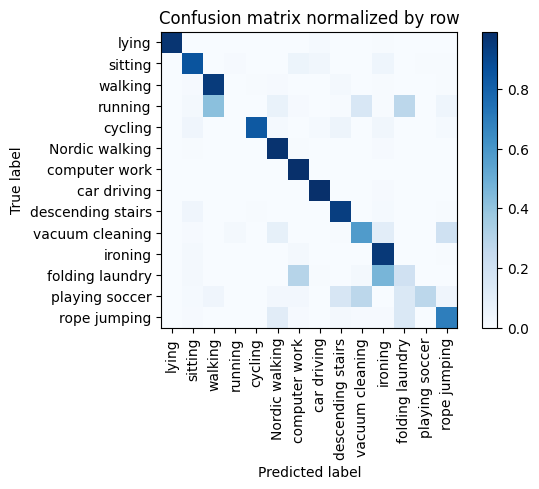

Training Epoch:   7%|▋         | 1/15 [00:25<05:59, 25.65s/it]

Overall accuracy: 0.814

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.859      0.992      0.921      0.149        619|	 rope jumping: 0.003,	playing soccer: 0.002,	
          ironing       0.708      0.954      0.813      0.109        453|	 computer work: 0.020,	sitting: 0.018,	
          walking       0.846      0.948      0.894      0.107        446|	 descending stairs: 0.016,	sitting: 0.011,	
          sitting       0.862      0.853      0.858      0.092        382|	 computer work: 0.052,	ironing: 0.045,	
   Nordic walking       0.850      0.978      0.910      0.088        365|	 ironing: 0.008,	computer work: 0.005,	
            lying       1.000      0.969      0.984      0.085        355|	 car driving: 0.014,	ironing: 0.006,	
  vacuum cleaning       0.786      0.577      0.666      0.084        350|	 rope jumping: 0.200,	ironing: 0.103,	
          cycling       0.985      0.834      0.903      0.078        


train: 100%|██████████| 261/261 [00:23<00:00, 11.12batch/s, loss=10.7, accuracy=0.812]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:02<00:00, 21.75batch/s, loss=11.5]


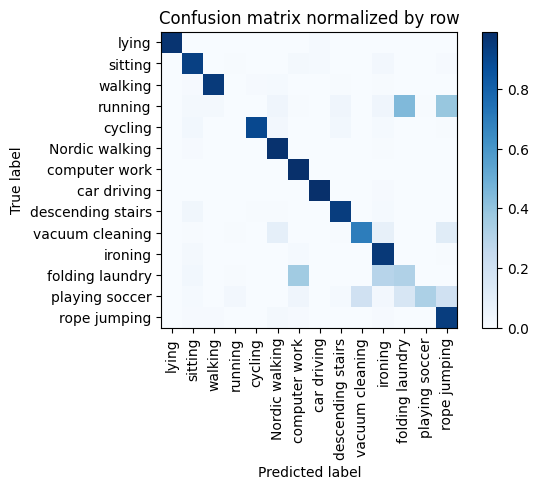

Training Epoch:  13%|█▎        | 2/15 [00:52<05:41, 26.30s/it]

Overall accuracy: 0.850

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.862      0.992      0.923      0.149        619|	 rope jumping: 0.003,	playing soccer: 0.002,	
          ironing       0.776      0.956      0.857      0.108        450|	 sitting: 0.022,	computer work: 0.013,	
          walking       0.988      0.952      0.970      0.106        441|	 Nordic walking: 0.014,	cycling: 0.011,	
          sitting       0.876      0.928      0.901      0.093        387|	 ironing: 0.026,	computer work: 0.016,	
   Nordic walking       0.865      0.981      0.920      0.088        367|	 sitting: 0.011,	ironing: 0.005,	
            lying       1.000      0.975      0.987      0.085        355|	 car driving: 0.014,	ironing: 0.003,	
  vacuum cleaning       0.935      0.696      0.798      0.084        349|	 rope jumping: 0.115,	Nordic walking: 0.089,	
          cycling       0.980      0.896      0.936      0.078        32


train: 100%|██████████| 261/261 [00:23<00:00, 11.06batch/s, loss=8.62, accuracy=0.844]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 21.64batch/s, loss=8.73]


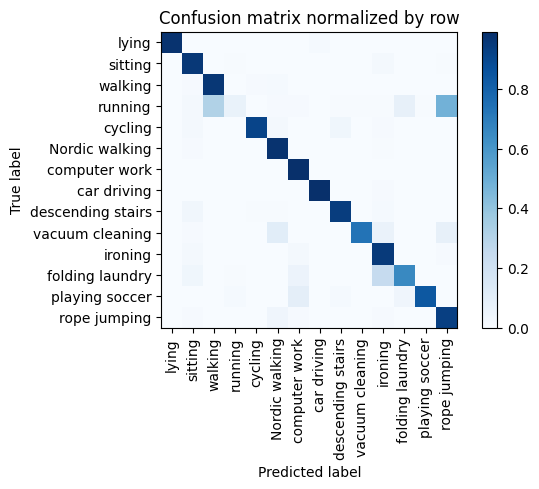

Training Epoch:  20%|██        | 3/15 [01:19<05:18, 26.57s/it]

Overall accuracy: 0.887

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.951      0.992      0.971      0.149        621|	 rope jumping: 0.003,	sitting: 0.003,	
          ironing       0.820      0.951      0.881      0.108        451|	 sitting: 0.020,	computer work: 0.016,	
          walking       0.886      0.964      0.923      0.106        442|	 Nordic walking: 0.014,	cycling: 0.011,	
          sitting       0.888      0.959      0.922      0.093        387|	 ironing: 0.018,	rope jumping: 0.005,	
   Nordic walking       0.862      0.978      0.917      0.088        365|	 sitting: 0.008,	ironing: 0.005,	
            lying       1.000      0.977      0.989      0.085        354|	 car driving: 0.014,	vacuum cleaning: 0.003,	
  vacuum cleaning       0.985      0.734      0.841      0.084        349|	 Nordic walking: 0.106,	rope jumping: 0.080,	
          cycling       0.977      0.911      0.943      0.078        32


train: 100%|██████████| 261/261 [00:24<00:00, 10.72batch/s, loss=9.91, accuracy=0.859]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 21.39batch/s, loss=7.92]


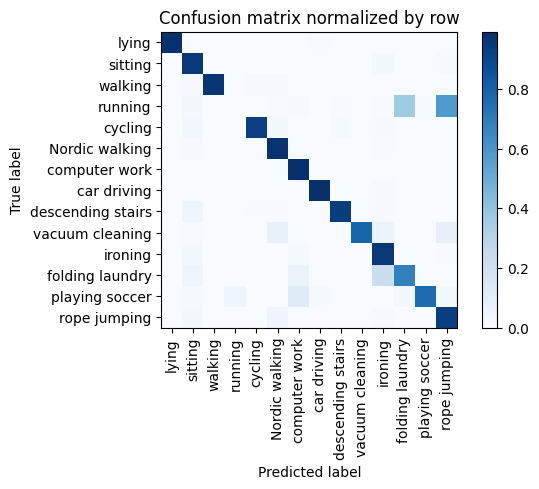

Training Epoch:  27%|██▋       | 4/15 [01:46<04:57, 27.01s/it]

Overall accuracy: 0.892

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.951      0.992      0.971      0.150        624|	 rope jumping: 0.002,	playing soccer: 0.002,	
          ironing       0.836      0.960      0.894      0.108        451|	 sitting: 0.018,	computer work: 0.013,	
          walking       1.000      0.966      0.983      0.107        445|	 Nordic walking: 0.011,	sitting: 0.011,	
          sitting       0.876      0.961      0.917      0.092        384|	 ironing: 0.018,	rope jumping: 0.010,	
   Nordic walking       0.890      0.978      0.932      0.088        365|	 sitting: 0.011,	ironing: 0.005,	
            lying       1.000      0.983      0.991      0.084        351|	 car driving: 0.006,	playing soccer: 0.003,	
  vacuum cleaning       0.989      0.788      0.877      0.084        349|	 rope jumping: 0.080,	Nordic walking: 0.072,	
          cycling       0.980      0.926      0.953      0.078    


train: 100%|██████████| 261/261 [00:25<00:00, 10.42batch/s, loss=8.15, accuracy=0.844]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.87batch/s, loss=7.79]


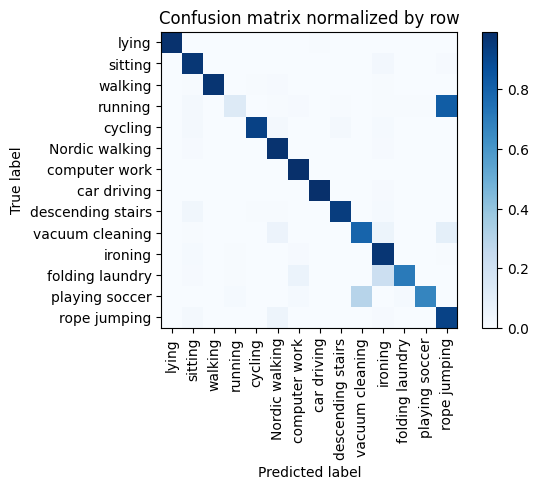

Training Epoch:  33%|███▎      | 5/15 [02:15<04:36, 27.67s/it]

Overall accuracy: 0.900

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.967      0.994      0.980      0.149        620|	 rope jumping: 0.003,	ironing: 0.002,	
          ironing       0.827      0.967      0.892      0.108        451|	 sitting: 0.013,	computer work: 0.011,	
          walking       1.000      0.971      0.985      0.107        444|	 Nordic walking: 0.011,	cycling: 0.007,	
          sitting       0.912      0.966      0.938      0.092        384|	 ironing: 0.023,	rope jumping: 0.008,	
   Nordic walking       0.906      0.981      0.942      0.088        365|	 ironing: 0.008,	sitting: 0.008,	
            lying       1.000      0.983      0.992      0.086        356|	 car driving: 0.006,	playing soccer: 0.003,	
  vacuum cleaning       0.923      0.793      0.853      0.084        348|	 rope jumping: 0.092,	Nordic walking: 0.055,	
          cycling       0.987      0.926      0.956      0.078        326


train: 100%|██████████| 261/261 [00:27<00:00,  9.55batch/s, loss=7.61, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.58batch/s, loss=6.94]


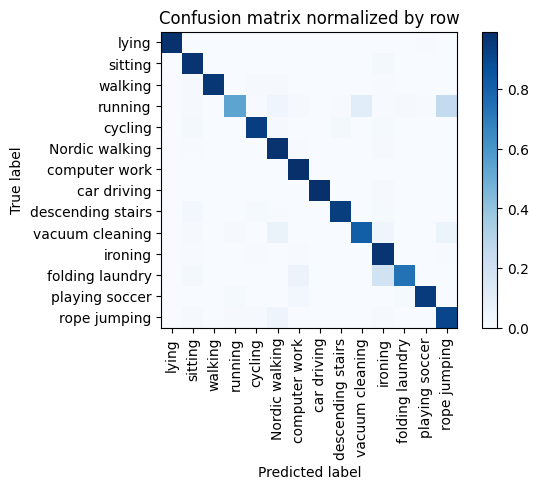

Training Epoch:  40%|████      | 6/15 [02:47<04:19, 28.87s/it]

Overall accuracy: 0.927

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.967      0.994      0.980      0.149        619|	 rope jumping: 0.003,	ironing: 0.002,	
          ironing       0.847      0.978      0.908      0.108        449|	 sitting: 0.007,	rope jumping: 0.004,	
          walking       1.000      0.966      0.983      0.107        444|	 Nordic walking: 0.011,	cycling: 0.009,	
          sitting       0.922      0.977      0.948      0.093        385|	 ironing: 0.016,	playing soccer: 0.003,	
   Nordic walking       0.890      0.981      0.933      0.087        364|	 ironing: 0.008,	computer work: 0.005,	
            lying       1.000      0.983      0.992      0.086        356|	 playing soccer: 0.006,	ironing: 0.003,	
  vacuum cleaning       0.934      0.811      0.869      0.084        350|	 Nordic walking: 0.063,	rope jumping: 0.060,	
          cycling       0.962      0.935      0.949      0.078        


train: 100%|██████████| 261/261 [00:27<00:00,  9.35batch/s, loss=6.84, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.38batch/s, loss=6.84]


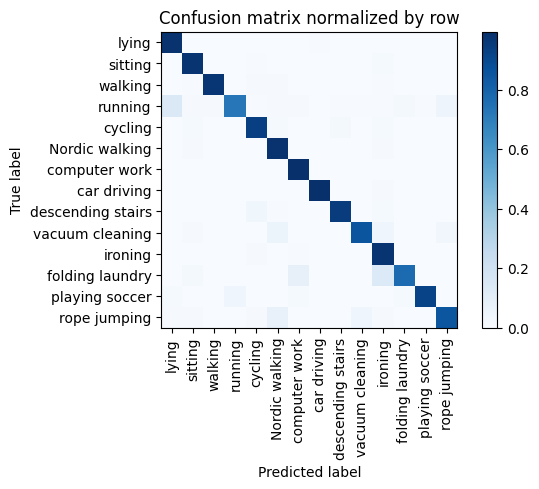

Training Epoch:  47%|████▋     | 7/15 [03:18<03:58, 29.76s/it]

Overall accuracy: 0.939

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.963      0.995      0.979      0.149        621|	 rope jumping: 0.003,	sitting: 0.002,	
          ironing       0.871      0.978      0.921      0.107        447|	 cycling: 0.009,	computer work: 0.007,	
          walking       0.995      0.970      0.983      0.106        440|	 Nordic walking: 0.009,	cycling: 0.009,	
          sitting       0.945      0.974      0.959      0.093        387|	 ironing: 0.013,	cycling: 0.005,	
   Nordic walking       0.898      0.981      0.938      0.088        367|	 ironing: 0.008,	sitting: 0.008,	
            lying       0.928      0.983      0.955      0.085        354|	 car driving: 0.006,	playing soccer: 0.003,	
  vacuum cleaning       0.974      0.854      0.910      0.084        350|	 Nordic walking: 0.060,	ironing: 0.040,	
          cycling       0.942      0.936      0.939      0.079        327|	 descend


train: 100%|██████████| 261/261 [00:28<00:00,  9.24batch/s, loss=6.8, accuracy=0.906]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 17.25batch/s, loss=6.39]


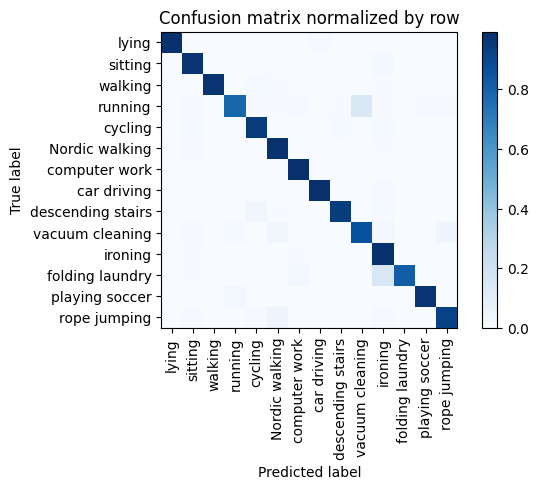

Training Epoch:  53%|█████▎    | 8/15 [03:51<03:34, 30.64s/it]

Overall accuracy: 0.950

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.981      0.994      0.987      0.150        622|	 rope jumping: 0.002,	ironing: 0.002,	
          ironing       0.870      0.982      0.922      0.108        448|	 computer work: 0.004,	sitting: 0.004,	
          walking       1.000      0.973      0.986      0.106        443|	 cycling: 0.014,	Nordic walking: 0.007,	
          sitting       0.954      0.972      0.963      0.093        387|	 ironing: 0.018,	rope jumping: 0.003,	
   Nordic walking       0.937      0.981      0.959      0.088        365|	 sitting: 0.008,	ironing: 0.005,	
            lying       1.000      0.983      0.992      0.086        356|	 car driving: 0.008,	ironing: 0.003,	
  vacuum cleaning       0.912      0.868      0.890      0.084        348|	 rope jumping: 0.040,	Nordic walking: 0.037,	
          cycling       0.945      0.950      0.948      0.078        323|	 iron


train: 100%|██████████| 261/261 [00:30<00:00,  8.58batch/s, loss=7.56, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 16.05batch/s, loss=6.16]


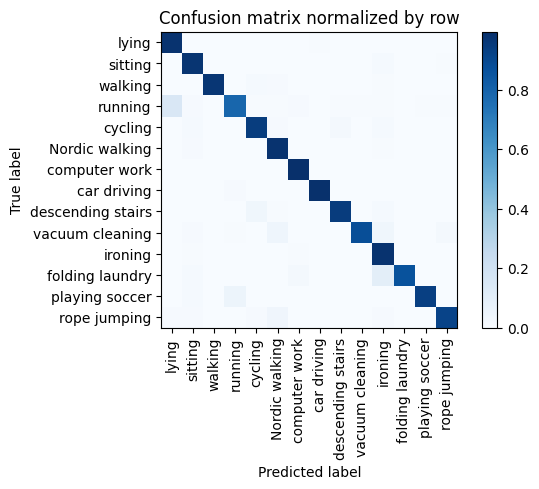

Training Epoch:  60%|██████    | 9/15 [04:26<03:11, 31.96s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.983      0.995      0.989      0.149        621|	 sitting: 0.003,	running: 0.002,	
          ironing       0.891      0.982      0.934      0.108        449|	 computer work: 0.004,	sitting: 0.004,	
          walking       1.000      0.971      0.985      0.106        441|	 cycling: 0.014,	Nordic walking: 0.009,	
          sitting       0.945      0.974      0.959      0.093        385|	 ironing: 0.013,	rope jumping: 0.005,	
   Nordic walking       0.923      0.981      0.951      0.088        366|	 sitting: 0.008,	ironing: 0.005,	
            lying       0.928      0.983      0.955      0.086        356|	 car driving: 0.006,	playing soccer: 0.003,	
  vacuum cleaning       0.994      0.880      0.933      0.084        350|	 Nordic walking: 0.046,	ironing: 0.037,	
          cycling       0.945      0.942      0.944      0.079        328|	 descend


train: 100%|██████████| 261/261 [00:27<00:00,  9.63batch/s, loss=6.6, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.46batch/s, loss=5.81]


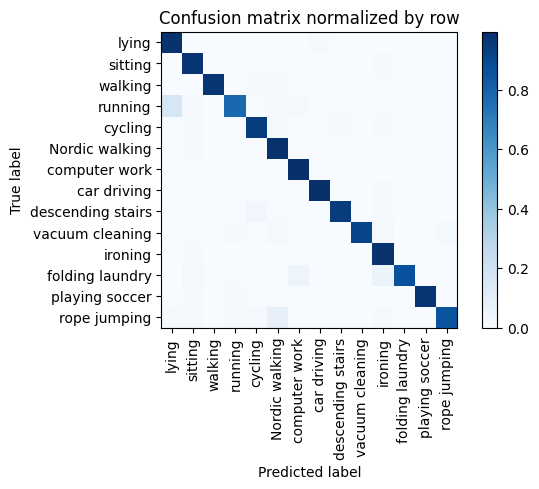

Training Epoch:  67%|██████▋   | 10/15 [04:56<02:38, 31.66s/it]

Overall accuracy: 0.954

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.978      0.995      0.986      0.149        619|	 sitting: 0.005,	rope jumping: 0.000,	
          ironing       0.917      0.980      0.948      0.109        452|	 sitting: 0.011,	rope jumping: 0.002,	
          walking       1.000      0.971      0.985      0.106        443|	 cycling: 0.014,	Nordic walking: 0.009,	
          sitting       0.933      0.977      0.955      0.093        388|	 ironing: 0.010,	running: 0.005,	
   Nordic walking       0.930      0.984      0.956      0.088        365|	 sitting: 0.008,	rope jumping: 0.003,	
  vacuum cleaning       0.994      0.917      0.954      0.084        351|	 ironing: 0.023,	Nordic walking: 0.020,	
            lying       0.920      0.983      0.950      0.084        351|	 car driving: 0.009,	ironing: 0.003,	
          cycling       0.945      0.942      0.943      0.079        327|	 ironing: 0


train: 100%|██████████| 261/261 [00:27<00:00,  9.67batch/s, loss=7.18, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.97batch/s, loss=6.32]


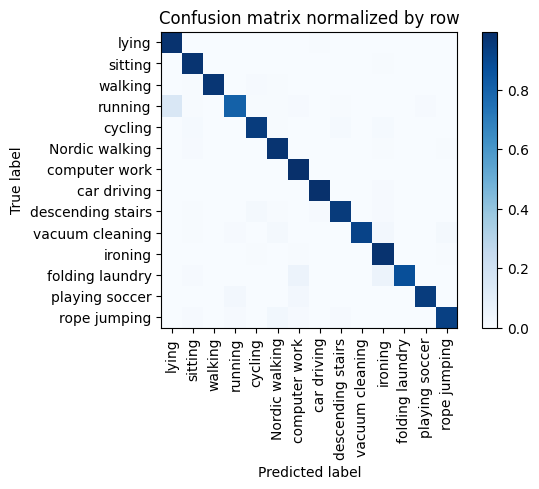

Training Epoch:  73%|███████▎  | 11/15 [05:27<02:05, 31.38s/it]

Overall accuracy: 0.958

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.966      0.995      0.980      0.150        622|	 rope jumping: 0.002,	vacuum cleaning: 0.002,	
          ironing       0.926      0.980      0.952      0.108        449|	 computer work: 0.007,	rope jumping: 0.004,	
          walking       1.000      0.971      0.985      0.107        445|	 cycling: 0.011,	Nordic walking: 0.007,	
          sitting       0.950      0.979      0.964      0.093        386|	 ironing: 0.008,	playing soccer: 0.003,	
   Nordic walking       0.957      0.978      0.968      0.088        366|	 sitting: 0.008,	rope jumping: 0.005,	
            lying       0.930      0.983      0.956      0.085        353|	 car driving: 0.006,	playing soccer: 0.003,	
  vacuum cleaning       0.991      0.920      0.954      0.084        350|	 ironing: 0.026,	rope jumping: 0.017,	
          cycling       0.960      0.948      0.954      0.0


train: 100%|██████████| 261/261 [00:27<00:00,  9.51batch/s, loss=7.18, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.51batch/s, loss=5.77]


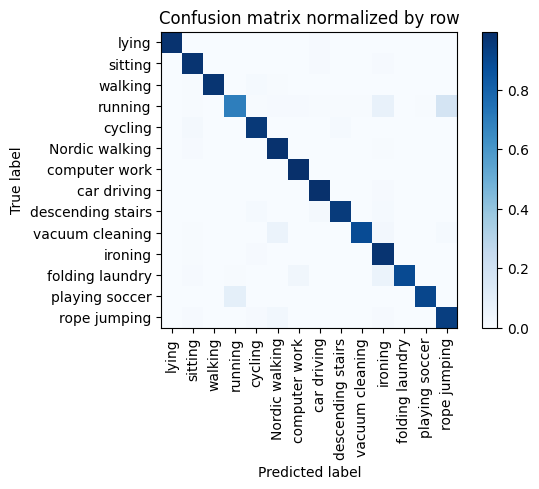

Training Epoch:  80%|████████  | 12/15 [05:58<01:33, 31.30s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.981      0.995      0.988      0.148        617|	 sitting: 0.003,	cycling: 0.002,	
          ironing       0.900      0.978      0.937      0.109        452|	 cycling: 0.009,	sitting: 0.004,	
          walking       1.000      0.973      0.986      0.106        442|	 cycling: 0.014,	Nordic walking: 0.005,	
          sitting       0.947      0.977      0.961      0.092        383|	 ironing: 0.010,	car driving: 0.008,	
   Nordic walking       0.923      0.984      0.953      0.088        368|	 sitting: 0.008,	ironing: 0.005,	
            lying       1.000      0.983      0.992      0.086        356|	 car driving: 0.008,	ironing: 0.003,	
  vacuum cleaning       0.990      0.889      0.937      0.084        350|	 Nordic walking: 0.060,	ironing: 0.026,	
          cycling       0.948      0.960      0.954      0.078        326|	 sitting: 0.018,	desce


train: 100%|██████████| 261/261 [00:26<00:00,  9.82batch/s, loss=6.39, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.13batch/s, loss=5.42]


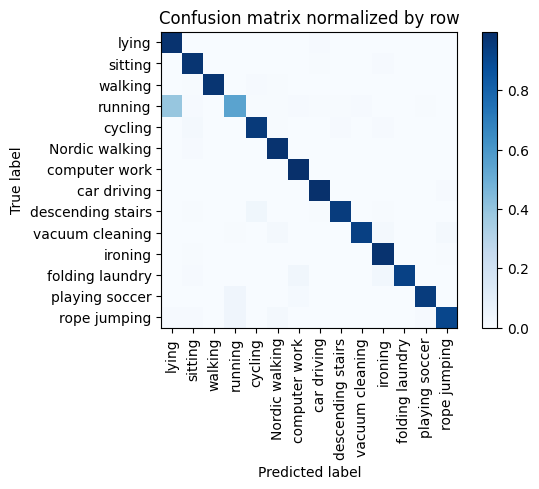

Training Epoch:  87%|████████▋ | 13/15 [06:29<01:01, 30.99s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.979      0.997      0.988      0.149        618|	 ironing: 0.002,	running: 0.002,	
          ironing       0.948      0.984      0.966      0.108        449|	 sitting: 0.007,	rope jumping: 0.004,	
          walking       1.000      0.975      0.987      0.107        445|	 cycling: 0.009,	Nordic walking: 0.007,	
          sitting       0.947      0.974      0.961      0.093        387|	 ironing: 0.010,	car driving: 0.005,	
   Nordic walking       0.963      0.984      0.973      0.088        368|	 sitting: 0.008,	ironing: 0.003,	
            lying       0.835      0.983      0.903      0.085        354|	 car driving: 0.008,	ironing: 0.003,	
  vacuum cleaning       0.991      0.934      0.962      0.084        350|	 ironing: 0.020,	rope jumping: 0.017,	
          cycling       0.954      0.954      0.954      0.079        327|	 sitting: 0.018,	ir


train: 100%|██████████| 261/261 [00:26<00:00,  9.69batch/s, loss=6.09, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.06batch/s, loss=5.79]


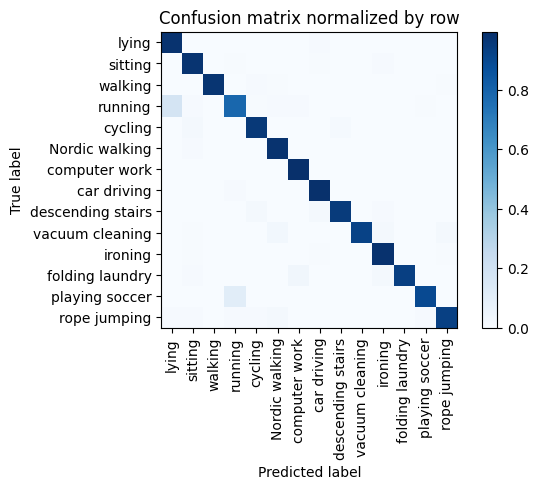

Training Epoch:  93%|█████████▎| 14/15 [06:59<00:30, 30.89s/it]

Overall accuracy: 0.961

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.982      0.995      0.989      0.149        620|	 sitting: 0.003,	running: 0.002,	
          ironing       0.959      0.984      0.971      0.108        450|	 sitting: 0.007,	rope jumping: 0.004,	
          walking       1.000      0.975      0.987      0.107        444|	 cycling: 0.011,	Nordic walking: 0.007,	
          sitting       0.942      0.976      0.959      0.092        382|	 ironing: 0.008,	car driving: 0.005,	
   Nordic walking       0.955      0.981      0.968      0.088        368|	 sitting: 0.008,	rope jumping: 0.003,	
            lying       0.916      0.983      0.948      0.085        353|	 car driving: 0.008,	ironing: 0.003,	
  vacuum cleaning       0.997      0.923      0.958      0.084        349|	 Nordic walking: 0.029,	rope jumping: 0.020,	
          cycling       0.966      0.957      0.961      0.078        324|	 sittin


train: 100%|██████████| 261/261 [00:26<00:00,  9.83batch/s, loss=6.97, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.67batch/s, loss=5.84]


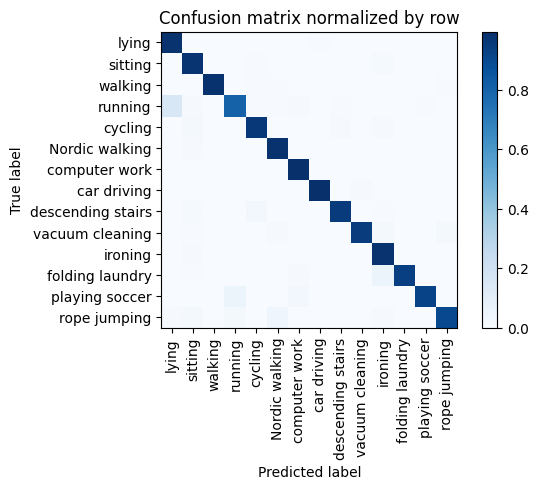

Overall accuracy: 0.965

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.986      0.995      0.990      0.149        621|	 sitting: 0.003,	ironing: 0.002,	
          ironing       0.936      0.982      0.959      0.108        449|	 sitting: 0.009,	rope jumping: 0.002,	
          walking       1.000      0.984      0.992      0.106        443|	 rope jumping: 0.005,	Nordic walking: 0.005,	
          sitting       0.935      0.979      0.957      0.092        384|	 ironing: 0.013,	cycling: 0.005,	
   Nordic walking       0.973      0.984      0.978      0.088        367|	 sitting: 0.008,	rope jumping: 0.003,	
            lying       0.926      0.983      0.953      0.085        354|	 car driving: 0.006,	playing soccer: 0.003,	
  vacuum cleaning       0.994      0.946      0.969      0.084        349|	 rope jumping: 0.017,	ironing: 0.017,	
          cycling       0.960      0.960      0.960      0.079        328|	 sitti

unseen: 100%|██████████| 87/87 [00:04<00:00, 17.86batch/s, loss=13.1]


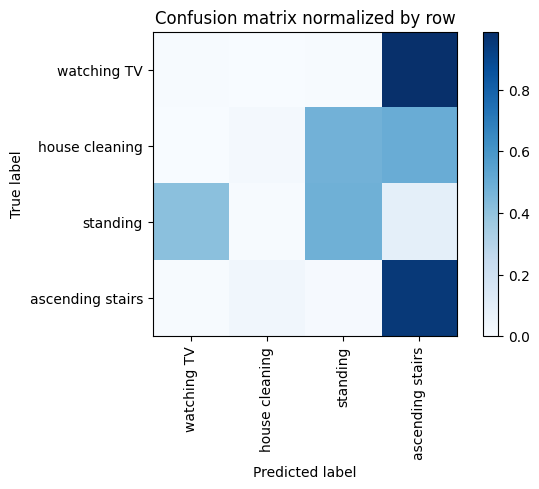

Overall accuracy: 0.352

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        standing       0.504      0.486      0.495      0.332       1847|	 watching TV: 0.416,	ascending stairs: 0.091,	
  house cleaning       0.422      0.019      0.037      0.328       1825|	 ascending stairs: 0.501,	standing: 0.476,	
ascending stairs       0.350      0.951      0.511      0.193       1073|	 house cleaning: 0.034,	standing: 0.010,	
     watching TV       0.006      0.006      0.006      0.148        823|	 ascending stairs: 0.988,	standing: 0.006,	

----------------------------------------------------------------------------------------------------
     avg / total       0.374      0.352      0.276        1.0       5568|	      

{'accuracy': 0.3516522988505747, 'precision': 0.32037196251223854, 'recall': 0.36551325558901393, 'f1': 0.2622687197890141}
================ Fold-1 ================
Unseen Classes : ['walking', 'rope jumping', 'sitting', 'desc

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 262/262 [00:26<00:00,  9.79batch/s, loss=12.1, accuracy=0.734]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.60batch/s, loss=15]


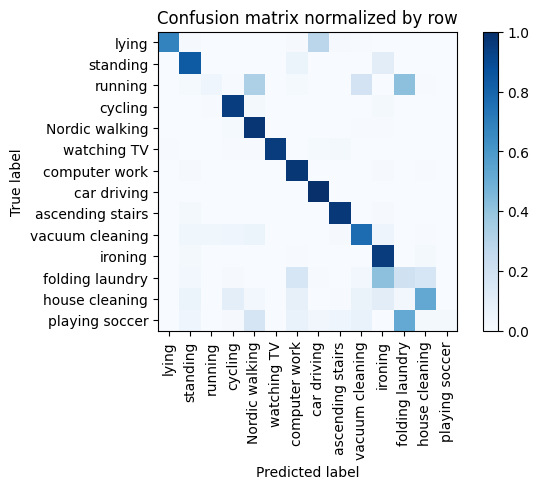

Training Epoch:   7%|▋         | 1/15 [00:30<07:08, 30.60s/it]

Overall accuracy: 0.776

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.858      0.972      0.911      0.146        607|	 ironing: 0.008,	standing: 0.008,	
         ironing       0.699      0.949      0.805      0.114        475|	 house cleaning: 0.021,	standing: 0.021,	
  house cleaning       0.793      0.525      0.631      0.093        387|	 ironing: 0.103,	cycling: 0.098,	
  Nordic walking       0.776      0.976      0.865      0.091        380|	 cycling: 0.013,	ironing: 0.005,	
        standing       0.803      0.832      0.817      0.085        352|	 ironing: 0.105,	computer work: 0.060,	
           lying       0.996      0.679      0.807      0.085        352|	 car driving: 0.284,	ascending stairs: 0.011,	
 vacuum cleaning       0.779      0.766      0.772      0.084        350|	 Nordic walking: 0.054,	ironing: 0.049,	
         cycling       0.824      0.942      0.879      0.075        313|	 ironing: 0.022,	N


train: 100%|██████████| 262/262 [00:26<00:00,  9.76batch/s, loss=12, accuracy=0.812]  


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.20batch/s, loss=10.6]


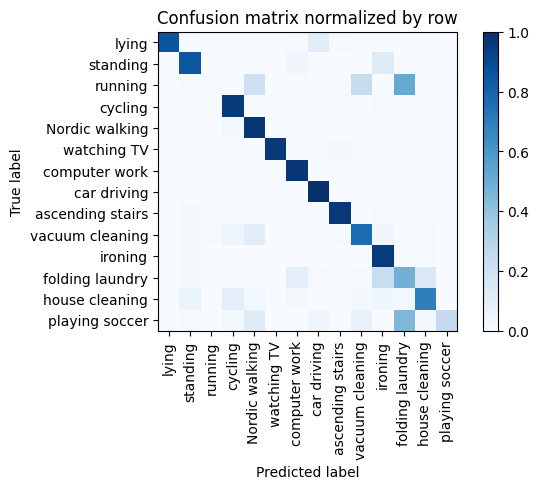

Training Epoch:  13%|█▎        | 2/15 [01:01<06:39, 30.72s/it]

Overall accuracy: 0.827

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.925      0.974      0.949      0.146        608|	 ironing: 0.007,	house cleaning: 0.005,	
         ironing       0.784      0.954      0.860      0.115        478|	 standing: 0.023,	house cleaning: 0.010,	
  house cleaning       0.856      0.694      0.767      0.093        386|	 cycling: 0.101,	standing: 0.060,	
  Nordic walking       0.788      0.976      0.872      0.091        380|	 cycling: 0.016,	ironing: 0.005,	
 vacuum cleaning       0.820      0.766      0.792      0.084        350|	 Nordic walking: 0.109,	cycling: 0.043,	
        standing       0.834      0.848      0.841      0.084        349|	 ironing: 0.117,	computer work: 0.034,	
           lying       1.000      0.859      0.924      0.084        348|	 car driving: 0.106,	ascending stairs: 0.009,	
         cycling       0.817      0.958      0.882      0.075        313|	 Nordic wal


train: 100%|██████████| 262/262 [00:26<00:00,  9.72batch/s, loss=11, accuracy=0.891]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.55batch/s, loss=8.57]


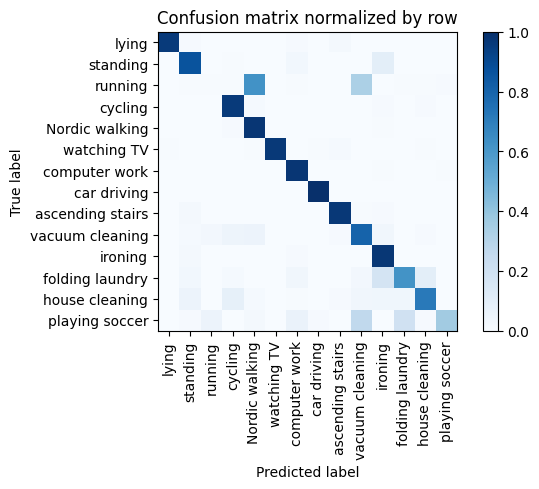

Training Epoch:  20%|██        | 3/15 [01:32<06:08, 30.68s/it]

Overall accuracy: 0.854

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.944      0.975      0.959      0.144        601|	 playing soccer: 0.007,	ironing: 0.007,	
         ironing       0.813      0.971      0.885      0.115        479|	 standing: 0.017,	computer work: 0.008,	
  house cleaning       0.897      0.717      0.797      0.094        389|	 cycling: 0.085,	standing: 0.057,	
  Nordic walking       0.727      0.976      0.833      0.092        381|	 cycling: 0.010,	ironing: 0.005,	
        standing       0.850      0.866      0.858      0.085        352|	 ironing: 0.099,	computer work: 0.028,	
 vacuum cleaning       0.734      0.803      0.767      0.084        351|	 Nordic walking: 0.057,	cycling: 0.048,	
           lying       0.997      0.960      0.978      0.084        351|	 ascending stairs: 0.017,	standing: 0.011,	
         cycling       0.830      0.958      0.889      0.075        310|	 Nordic walking


train: 100%|██████████| 262/262 [00:27<00:00,  9.52batch/s, loss=9.48, accuracy=0.859]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.02batch/s, loss=10.2]


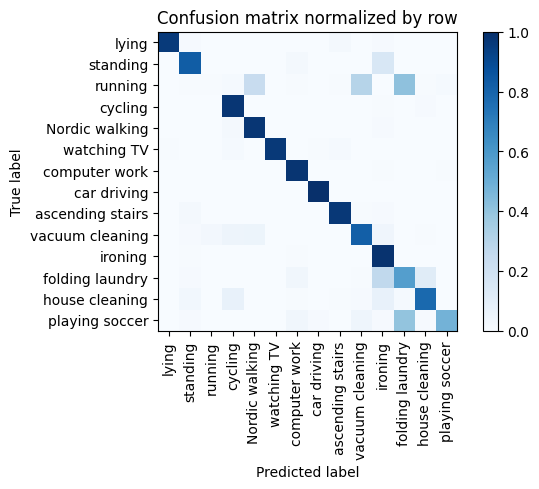

Training Epoch:  27%|██▋       | 4/15 [02:03<05:40, 30.92s/it]

Overall accuracy: 0.861

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.963      0.977      0.970      0.145        605|	 playing soccer: 0.007,	ironing: 0.007,	
         ironing       0.741      0.987      0.847      0.115        479|	 computer work: 0.006,	standing: 0.004,	
  house cleaning       0.901      0.778      0.835      0.093        388|	 ironing: 0.075,	cycling: 0.075,	
  Nordic walking       0.858      0.974      0.912      0.091        379|	 cycling: 0.016,	ironing: 0.008,	
        standing       0.912      0.826      0.867      0.084        351|	 ironing: 0.154,	computer work: 0.017,	
           lying       0.997      0.957      0.977      0.084        351|	 ascending stairs: 0.020,	ironing: 0.009,	
 vacuum cleaning       0.819      0.817      0.818      0.084        350|	 Nordic walking: 0.054,	cycling: 0.049,	
         cycling       0.838      0.974      0.901      0.075        313|	 house cleaning: 


train: 100%|██████████| 262/262 [00:29<00:00,  8.99batch/s, loss=9.41, accuracy=0.828]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 14.00batch/s, loss=7.76]


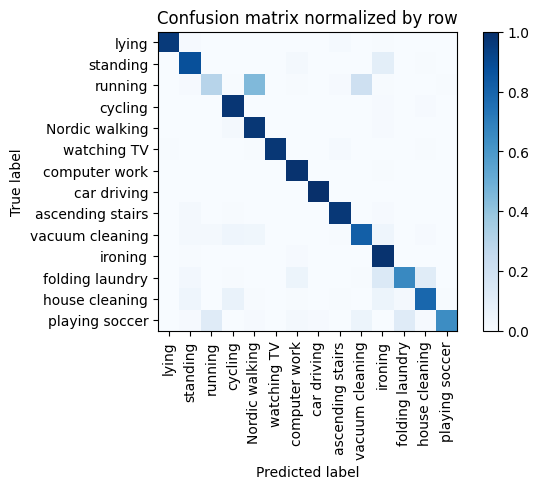

Training Epoch:  33%|███▎      | 5/15 [02:37<05:20, 32.07s/it]

Overall accuracy: 0.886

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.954      0.985      0.969      0.146        608|	 ironing: 0.007,	standing: 0.003,	
         ironing       0.803      0.985      0.885      0.114        476|	 computer work: 0.008,	standing: 0.006,	
  house cleaning       0.895      0.787      0.837      0.094        389|	 cycling: 0.067,	ironing: 0.054,	
  Nordic walking       0.794      0.971      0.874      0.091        378|	 cycling: 0.019,	ironing: 0.008,	
        standing       0.873      0.877      0.875      0.084        351|	 ironing: 0.100,	computer work: 0.017,	
 vacuum cleaning       0.872      0.817      0.843      0.084        349|	 ironing: 0.046,	cycling: 0.046,	
           lying       0.994      0.960      0.977      0.084        348|	 ascending stairs: 0.014,	standing: 0.011,	
         cycling       0.852      0.975      0.909      0.075        314|	 house cleaning: 0.010,	ironi


train: 100%|██████████| 262/262 [00:29<00:00,  8.96batch/s, loss=8.07, accuracy=0.859]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 19.08batch/s, loss=7.89]


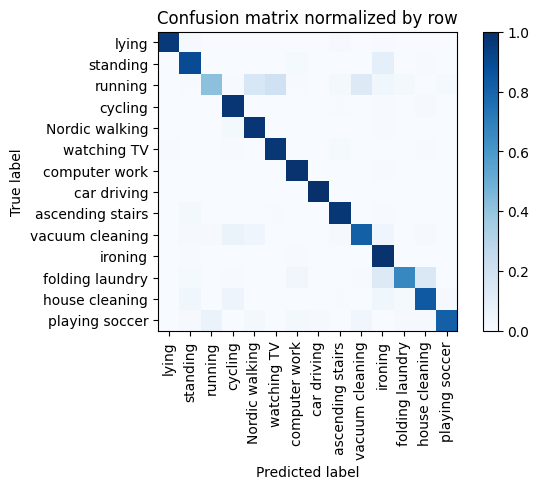

Training Epoch:  40%|████      | 6/15 [03:10<04:51, 32.39s/it]

Overall accuracy: 0.902

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.966      0.985      0.975      0.145        605|	 ironing: 0.005,	standing: 0.003,	
         ironing       0.824      0.987      0.898      0.115        478|	 computer work: 0.006,	standing: 0.006,	
  house cleaning       0.882      0.841      0.861      0.094        391|	 cycling: 0.049,	ironing: 0.036,	
  Nordic walking       0.895      0.973      0.932      0.090        376|	 cycling: 0.019,	ironing: 0.005,	
 vacuum cleaning       0.916      0.814      0.862      0.084        350|	 cycling: 0.063,	ironing: 0.043,	
           lying       0.994      0.963      0.978      0.084        350|	 ascending stairs: 0.009,	standing: 0.009,	
        standing       0.901      0.891      0.896      0.084        349|	 ironing: 0.086,	computer work: 0.014,	
         cycling       0.854      0.974      0.910      0.075        312|	 house cleaning: 0.010,	ironi


train: 100%|██████████| 262/262 [00:27<00:00,  9.44batch/s, loss=7.61, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.99batch/s, loss=7.42]


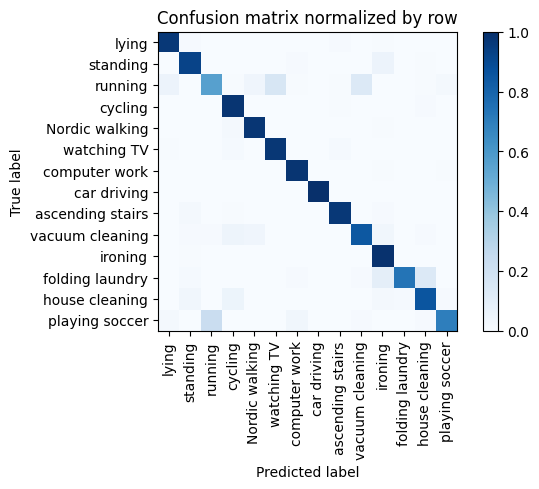

Training Epoch:  47%|████▋     | 7/15 [03:41<04:16, 32.10s/it]

Overall accuracy: 0.916

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.980      0.980      0.980      0.144        601|	 playing soccer: 0.007,	ironing: 0.005,	
         ironing       0.873      0.992      0.928      0.115        477|	 standing: 0.004,	computer work: 0.002,	
  house cleaning       0.893      0.857      0.875      0.094        391|	 cycling: 0.051,	standing: 0.033,	
  Nordic walking       0.944      0.974      0.958      0.091        378|	 cycling: 0.016,	ironing: 0.005,	
           lying       0.963      0.966      0.964      0.084        351|	 ascending stairs: 0.011,	standing: 0.009,	
 vacuum cleaning       0.919      0.846      0.881      0.084        350|	 cycling: 0.049,	Nordic walking: 0.040,	
        standing       0.915      0.926      0.920      0.084        350|	 ironing: 0.057,	computer work: 0.009,	
         cycling       0.862      0.978      0.916      0.075        313|	 house cleaning


train: 100%|██████████| 262/262 [00:27<00:00,  9.37batch/s, loss=6.97, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.35batch/s, loss=7.18]


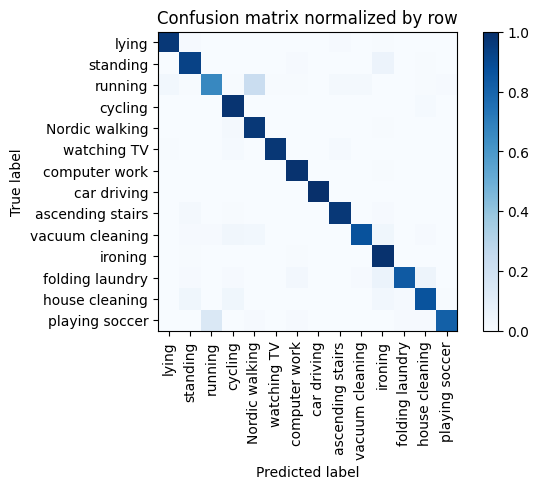

Training Epoch:  53%|█████▎    | 8/15 [04:13<03:44, 32.03s/it]

Overall accuracy: 0.931

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.977      0.987      0.982      0.146        606|	 ironing: 0.005,	standing: 0.003,	
         ironing       0.875      0.989      0.929      0.114        476|	 standing: 0.006,	computer work: 0.004,	
  house cleaning       0.931      0.867      0.898      0.094        390|	 cycling: 0.038,	standing: 0.036,	
  Nordic walking       0.881      0.969      0.923      0.092        382|	 cycling: 0.021,	ironing: 0.005,	
           lying       0.983      0.966      0.974      0.084        351|	 ascending stairs: 0.011,	standing: 0.009,	
 vacuum cleaning       0.977      0.868      0.919      0.084        348|	 ironing: 0.037,	cycling: 0.032,	
        standing       0.904      0.928      0.916      0.083        347|	 ironing: 0.058,	computer work: 0.009,	
         cycling       0.881      0.981      0.928      0.075        310|	 house cleaning: 0.013,	iron


train: 100%|██████████| 262/262 [00:28<00:00,  9.25batch/s, loss=7.72, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.51batch/s, loss=6.36]


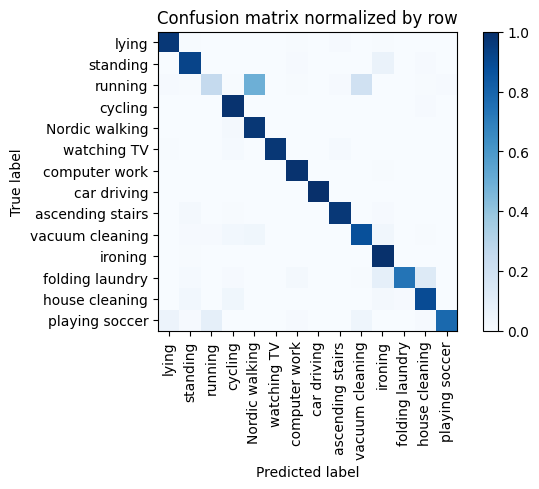

Training Epoch:  60%|██████    | 9/15 [04:46<03:12, 32.08s/it]

Overall accuracy: 0.912

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.980      0.987      0.983      0.144        600|	 ironing: 0.005,	standing: 0.003,	
         ironing       0.878      0.994      0.933      0.115        480|	 standing: 0.006,	playing soccer: 0.000,	
  house cleaning       0.899      0.892      0.895      0.094        389|	 cycling: 0.039,	standing: 0.031,	
  Nordic walking       0.791      0.971      0.872      0.092        382|	 cycling: 0.018,	house cleaning: 0.003,	
        standing       0.910      0.920      0.915      0.085        352|	 ironing: 0.062,	house cleaning: 0.009,	
           lying       0.977      0.966      0.971      0.085        352|	 ascending stairs: 0.011,	ironing: 0.006,	
 vacuum cleaning       0.884      0.877      0.881      0.084        349|	 Nordic walking: 0.037,	ironing: 0.032,	
         cycling       0.887      0.987      0.935      0.075        311|	 house cleani


train: 100%|██████████| 262/262 [00:27<00:00,  9.47batch/s, loss=7.24, accuracy=0.875]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.30batch/s, loss=6.5]


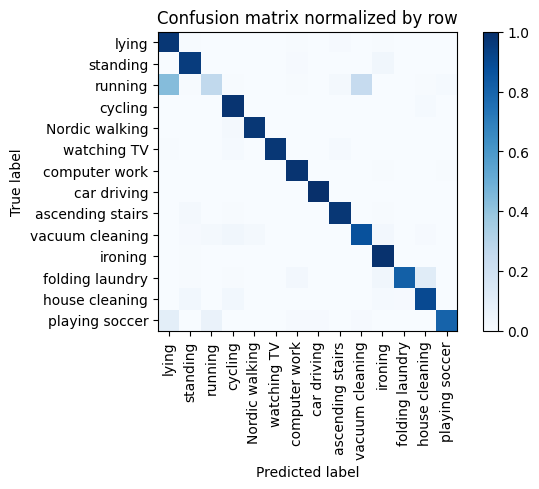

Training Epoch:  67%|██████▋   | 10/15 [05:17<02:39, 31.92s/it]

Overall accuracy: 0.920

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.977      0.982      0.979      0.145        602|	 playing soccer: 0.007,	ironing: 0.005,	
         ironing       0.920      0.992      0.955      0.115        477|	 standing: 0.004,	computer work: 0.002,	
  house cleaning       0.911      0.900      0.906      0.094        389|	 cycling: 0.031,	standing: 0.028,	
  Nordic walking       0.979      0.971      0.975      0.091        379|	 cycling: 0.021,	ironing: 0.003,	
           lying       0.799      0.969      0.875      0.085        352|	 ascending stairs: 0.009,	ironing: 0.006,	
        standing       0.925      0.951      0.938      0.084        348|	 ironing: 0.034,	computer work: 0.009,	
 vacuum cleaning       0.870      0.873      0.872      0.083        346|	 cycling: 0.035,	ironing: 0.026,	
         cycling       0.890      0.984      0.935      0.075        314|	 house cleaning: 0.013,


train: 100%|██████████| 262/262 [00:29<00:00,  8.81batch/s, loss=6.66, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.20batch/s, loss=6.54]


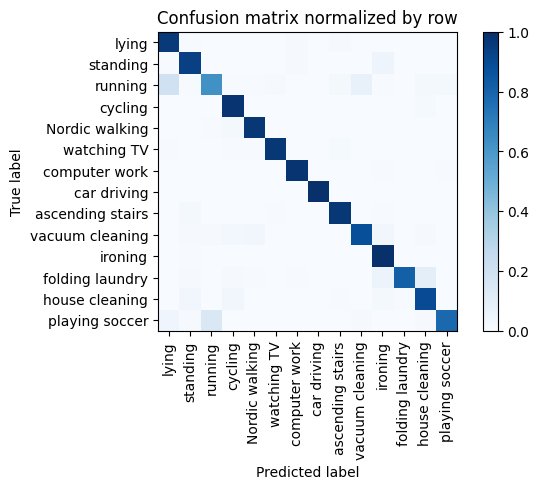

Training Epoch:  73%|███████▎  | 11/15 [05:51<02:09, 32.46s/it]

Overall accuracy: 0.933

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.985      0.983      0.984      0.145        602|	 playing soccer: 0.005,	ironing: 0.005,	
         ironing       0.898      0.994      0.944      0.115        479|	 standing: 0.006,	playing soccer: 0.000,	
  house cleaning       0.911      0.893      0.902      0.094        391|	 cycling: 0.033,	standing: 0.033,	
  Nordic walking       0.961      0.971      0.966      0.092        381|	 cycling: 0.016,	running: 0.005,	
        standing       0.914      0.937      0.925      0.084        350|	 ironing: 0.049,	computer work: 0.009,	
           lying       0.889      0.963      0.925      0.084        350|	 ascending stairs: 0.011,	computer work: 0.011,	
 vacuum cleaning       0.953      0.882      0.916      0.083        346|	 Nordic walking: 0.035,	ironing: 0.032,	
         cycling       0.903      0.984      0.942      0.075        312|	 house cl


train: 100%|██████████| 262/262 [00:28<00:00,  9.34batch/s, loss=7.69, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.23batch/s, loss=7.45]


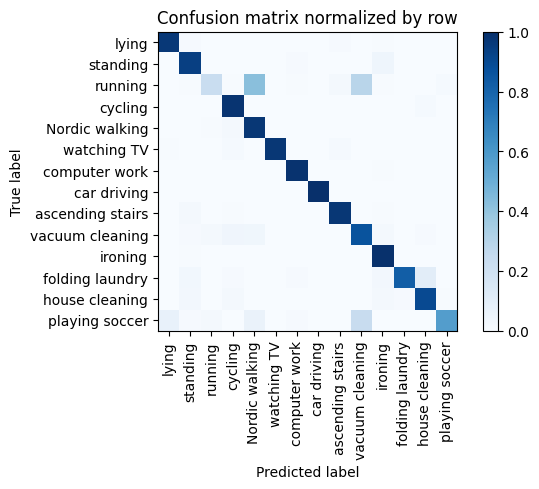

Training Epoch:  80%|████████  | 12/15 [06:23<01:37, 32.34s/it]

Overall accuracy: 0.914

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.987      0.987      0.987      0.146        607|	 ironing: 0.005,	standing: 0.003,	
         ironing       0.915      0.994      0.953      0.114        476|	 standing: 0.006,	playing soccer: 0.000,	
  house cleaning       0.914      0.902      0.908      0.094        389|	 standing: 0.026,	ironing: 0.023,	
  Nordic walking       0.803      0.971      0.879      0.092        381|	 cycling: 0.018,	running: 0.005,	
 vacuum cleaning       0.810      0.866      0.837      0.084        350|	 cycling: 0.040,	Nordic walking: 0.037,	
           lying       0.971      0.969      0.970      0.084        350|	 ascending stairs: 0.009,	standing: 0.009,	
        standing       0.906      0.940      0.923      0.084        349|	 ironing: 0.046,	computer work: 0.009,	
         cycling       0.896      0.984      0.938      0.075        314|	 house cleaning: 0.0


train: 100%|██████████| 262/262 [00:28<00:00,  9.15batch/s, loss=7.12, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 18.21batch/s, loss=6.82]


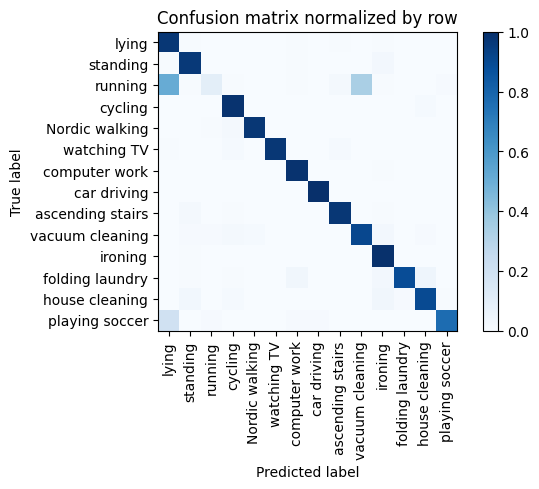

Training Epoch:  87%|████████▋ | 13/15 [06:55<01:04, 32.41s/it]

Overall accuracy: 0.921

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.978      0.987      0.983      0.144        599|	 ironing: 0.005,	standing: 0.003,	
         ironing       0.916      0.994      0.953      0.116        481|	 standing: 0.006,	playing soccer: 0.000,	
  house cleaning       0.948      0.897      0.922      0.093        388|	 ironing: 0.034,	standing: 0.028,	
  Nordic walking       0.987      0.971      0.979      0.091        380|	 cycling: 0.018,	running: 0.005,	
        standing       0.924      0.963      0.943      0.085        352|	 ironing: 0.026,	computer work: 0.006,	
 vacuum cleaning       0.844      0.909      0.875      0.084        351|	 ironing: 0.026,	cycling: 0.023,	
           lying       0.756      0.971      0.850      0.084        348|	 ironing: 0.006,	ascending stairs: 0.006,	
         cycling       0.922      0.987      0.953      0.075        311|	 house cleaning: 0.013,	play


train: 100%|██████████| 262/262 [00:29<00:00,  8.92batch/s, loss=9.15, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:03<00:00, 16.93batch/s, loss=7.37]


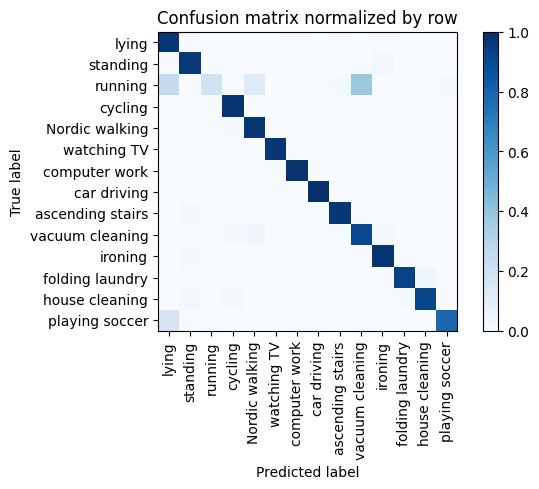

Training Epoch:  93%|█████████▎| 14/15 [07:29<00:32, 32.79s/it]

Overall accuracy: 0.927

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.988      0.987      0.988      0.145        603|	 ironing: 0.005,	standing: 0.003,	
         ironing       0.952      0.981      0.966      0.116        481|	 standing: 0.017,	cycling: 0.002,	
  house cleaning       0.944      0.912      0.928      0.093        387|	 standing: 0.026,	cycling: 0.023,	
  Nordic walking       0.916      0.974      0.944      0.092        382|	 cycling: 0.016,	running: 0.005,	
        standing       0.916      0.963      0.939      0.085        352|	 ironing: 0.026,	computer work: 0.006,	
 vacuum cleaning       0.822      0.905      0.861      0.083        347|	 Nordic walking: 0.035,	cycling: 0.020,	
           lying       0.842      0.971      0.902      0.083        346|	 ironing: 0.006,	ascending stairs: 0.006,	
         cycling       0.919      0.984      0.951      0.075        313|	 house cleaning: 0.013,	comp


train: 100%|██████████| 262/262 [00:34<00:00,  7.69batch/s, loss=8.08, accuracy=0.891]


torch.Size([14, 400])



seen: 100%|██████████| 65/65 [00:04<00:00, 13.05batch/s, loss=6.78]


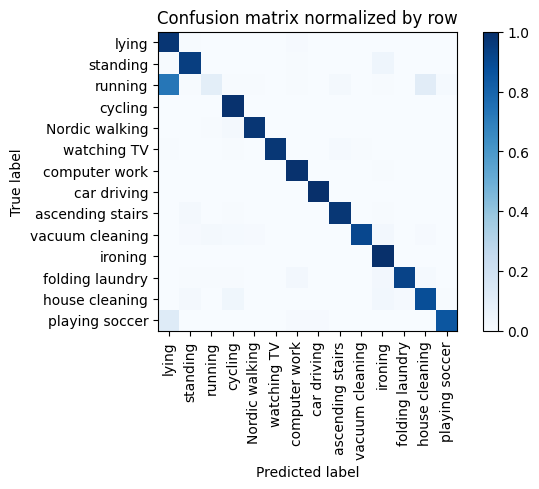

Overall accuracy: 0.923

                   precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

   computer work       0.977      0.988      0.983      0.146        606|	 ironing: 0.007,	playing soccer: 0.002,	
         ironing       0.909      0.998      0.951      0.115        480|	 standing: 0.002,	playing soccer: 0.000,	
  house cleaning       0.927      0.884      0.905      0.094        389|	 cycling: 0.036,	ironing: 0.028,	
  Nordic walking       0.989      0.974      0.981      0.091        378|	 cycling: 0.019,	running: 0.005,	
 vacuum cleaning       0.994      0.909      0.949      0.084        350|	 ironing: 0.026,	running: 0.023,	
        standing       0.938      0.943      0.940      0.084        350|	 ironing: 0.046,	computer work: 0.006,	
           lying       0.712      0.974      0.823      0.084        350|	 computer work: 0.011,	standing: 0.006,	
         cycling       0.909      0.990      0.948      0.075        313|	 playing soccer: 0.003,	h

unseen: 100%|██████████| 86/86 [00:05<00:00, 16.87batch/s, loss=10.6]


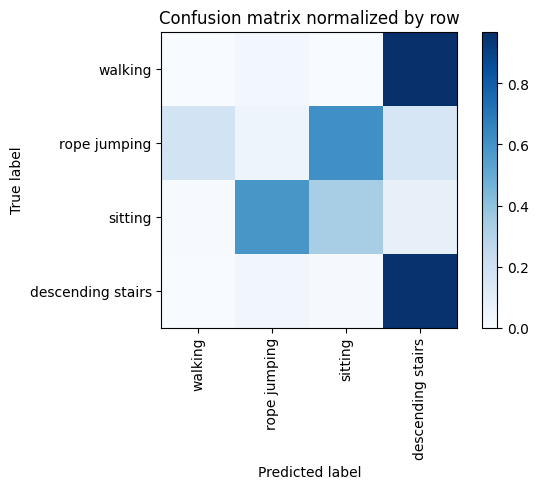

Overall accuracy: 0.277

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          walking       0.000      0.000      0.000      0.421       2317|	 descending stairs: 0.969,	rope jumping: 0.030,	sitting: 0.001,	
          sitting       0.675      0.333      0.446      0.325       1791|	 rope jumping: 0.585,	descending stairs: 0.078,	
descending stairs       0.269      0.959      0.420      0.172        944|	 rope jumping: 0.033,	sitting: 0.008,	
     rope jumping       0.019      0.049      0.027      0.082        452|	 sitting: 0.613,	walking: 0.181,	descending stairs: 0.157,	

----------------------------------------------------------------------------------------------------
      avg / total       0.267      0.277      0.220 0.9999999999999999       5504|	      

{'accuracy': 0.2768895348837209, 'precision': 0.2408559925094994, 'recall': 0.3351730850957452, 'f1': 0.22348505647264938}
================ Fold-2 ================
Unseen Class

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([14, 400])



train: 100%|██████████| 242/242 [00:26<00:00,  9.13batch/s, loss=13.8, accuracy=0.656]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.69batch/s, loss=12.5]


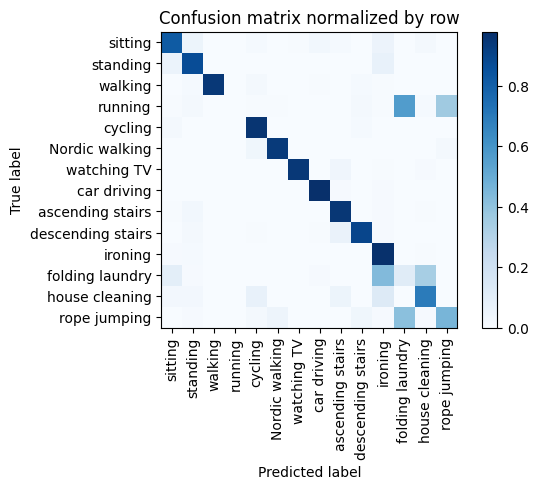

Training Epoch:   7%|▋         | 1/15 [00:30<07:03, 30.23s/it]

Overall accuracy: 0.807

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.720      0.972      0.827      0.130        499|	 standing: 0.012,	sitting: 0.010,	
          walking       0.998      0.946      0.971      0.116        446|	 cycling: 0.016,	descending stairs: 0.013,	
   Nordic walking       0.984      0.938      0.961      0.102        390|	 cycling: 0.036,	rope jumping: 0.021,	
   house cleaning       0.762      0.692      0.726      0.099        380|	 ironing: 0.124,	cycling: 0.076,	
         standing       0.852      0.869      0.861      0.093        359|	 ironing: 0.072,	sitting: 0.058,	
          sitting       0.810      0.815      0.812      0.086        329|	 ironing: 0.055,	standing: 0.052,	
          cycling       0.831      0.958      0.890      0.080        307|	 sitting: 0.020,	descending stairs: 0.013,	
  folding laundry       0.137      0.111      0.123      0.052        198|	 ironing: 0.434,	


train: 100%|██████████| 242/242 [00:27<00:00,  8.90batch/s, loss=9.47, accuracy=0.812]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.92batch/s, loss=8.21]


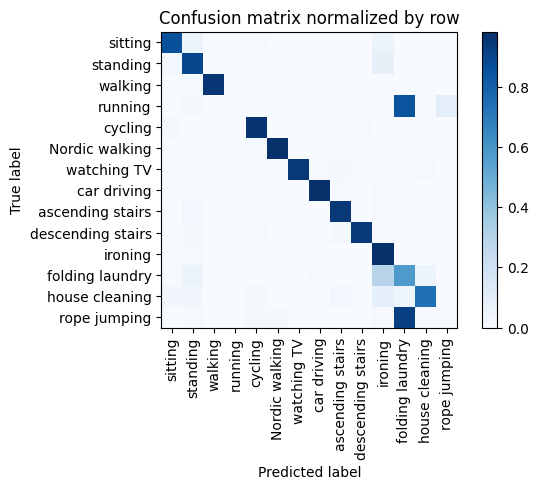

Training Epoch:  13%|█▎        | 2/15 [01:01<06:38, 30.63s/it]

Overall accuracy: 0.839

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.762      0.982      0.858      0.129        497|	 standing: 0.012,	house cleaning: 0.002,	
          walking       0.998      0.957      0.977      0.116        446|	 standing: 0.013,	Nordic walking: 0.009,	
   Nordic walking       0.980      0.980      0.980      0.102        393|	 cycling: 0.013,	house cleaning: 0.005,	
   house cleaning       0.924      0.738      0.820      0.099        381|	 ironing: 0.092,	folding laundry: 0.042,	
         standing       0.826      0.892      0.858      0.094        361|	 ironing: 0.080,	sitting: 0.028,	
          sitting       0.898      0.863      0.880      0.085        328|	 ironing: 0.058,	standing: 0.058,	
          cycling       0.916      0.961      0.938      0.080        307|	 sitting: 0.020,	descending stairs: 0.010,	
 ascending stairs       0.896      0.950      0.922      0.052        199|	 s


train: 100%|██████████| 242/242 [00:27<00:00,  8.85batch/s, loss=8.62, accuracy=0.922]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.65batch/s, loss=8.2] 


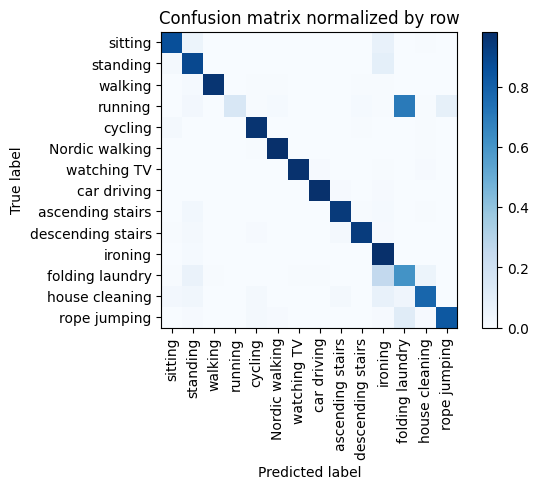

Training Epoch:  20%|██        | 3/15 [01:32<06:10, 30.83s/it]

Overall accuracy: 0.876

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.766      0.984      0.861      0.128        493|	 standing: 0.014,	cycling: 0.002,	
          walking       0.995      0.962      0.978      0.116        447|	 standing: 0.013,	descending stairs: 0.007,	
   Nordic walking       0.985      0.982      0.983      0.102        392|	 cycling: 0.008,	house cleaning: 0.005,	
   house cleaning       0.934      0.777      0.849      0.099        382|	 ironing: 0.076,	folding laundry: 0.039,	
         standing       0.823      0.891      0.856      0.093        359|	 ironing: 0.092,	sitting: 0.017,	
          sitting       0.923      0.867      0.894      0.086        330|	 ironing: 0.073,	standing: 0.052,	
          cycling       0.934      0.967      0.950      0.080        307|	 sitting: 0.016,	house cleaning: 0.007,	
 ascending stairs       0.935      0.945      0.940      0.052        199|	 standing


train: 100%|██████████| 242/242 [00:26<00:00,  9.00batch/s, loss=8.45, accuracy=0.828]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.71batch/s, loss=7.63]


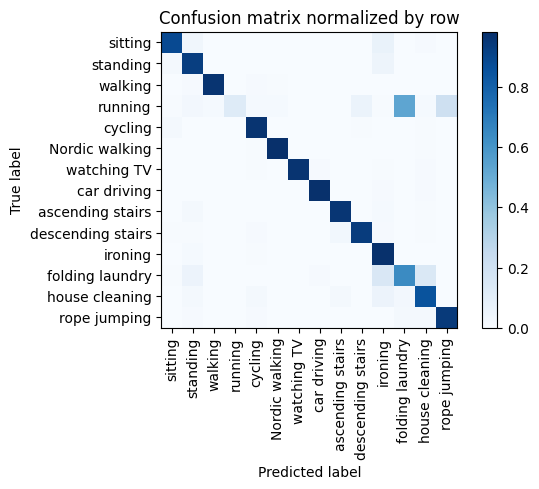

Training Epoch:  27%|██▋       | 4/15 [02:02<05:38, 30.75s/it]

Overall accuracy: 0.893

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.831      0.978      0.898      0.129        497|	 standing: 0.014,	cycling: 0.004,	
          walking       0.993      0.968      0.981      0.116        444|	 standing: 0.011,	cycling: 0.009,	
   Nordic walking       0.990      0.985      0.987      0.102        391|	 cycling: 0.008,	house cleaning: 0.005,	
   house cleaning       0.878      0.852      0.865      0.099        379|	 ironing: 0.055,	folding laundry: 0.026,	
         standing       0.866      0.931      0.897      0.094        360|	 ironing: 0.050,	sitting: 0.019,	
          sitting       0.942      0.888      0.914      0.086        330|	 ironing: 0.067,	standing: 0.033,	
          cycling       0.925      0.967      0.946      0.080        307|	 sitting: 0.020,	house cleaning: 0.007,	
 ascending stairs       0.941      0.960      0.950      0.052        200|	 standing: 0.020,	i


train: 100%|██████████| 242/242 [00:27<00:00,  8.85batch/s, loss=7.34, accuracy=0.844]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 18.12batch/s, loss=7.47]


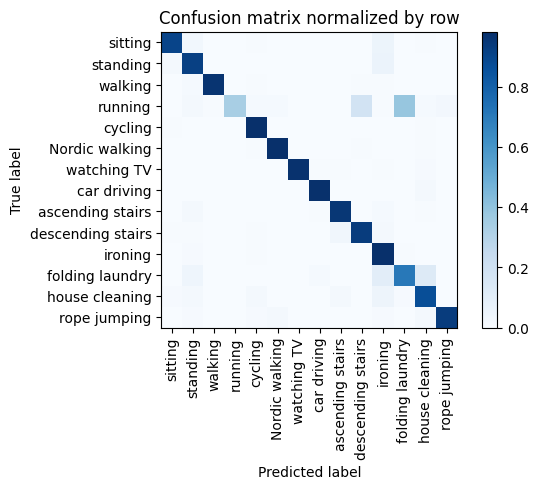

Training Epoch:  33%|███▎      | 5/15 [02:33<05:08, 30.84s/it]

Overall accuracy: 0.910

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.847      0.982      0.909      0.129        496|	 standing: 0.008,	folding laundry: 0.006,	
          walking       0.995      0.966      0.981      0.116        446|	 standing: 0.013,	descending stairs: 0.007,	
   Nordic walking       0.990      0.982      0.986      0.102        391|	 house cleaning: 0.005,	descending stairs: 0.005,	
   house cleaning       0.893      0.872      0.882      0.099        382|	 ironing: 0.047,	cycling: 0.021,	
         standing       0.877      0.919      0.898      0.093        358|	 ironing: 0.059,	sitting: 0.022,	
          sitting       0.952      0.903      0.927      0.086        330|	 ironing: 0.052,	standing: 0.030,	
          cycling       0.938      0.984      0.960      0.080        306|	 house cleaning: 0.007,	sitting: 0.007,	
 ascending stairs       0.932      0.955      0.943      0.052        201|


train: 100%|██████████| 242/242 [00:27<00:00,  8.95batch/s, loss=8.85, accuracy=0.797]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.24batch/s, loss=7.13]


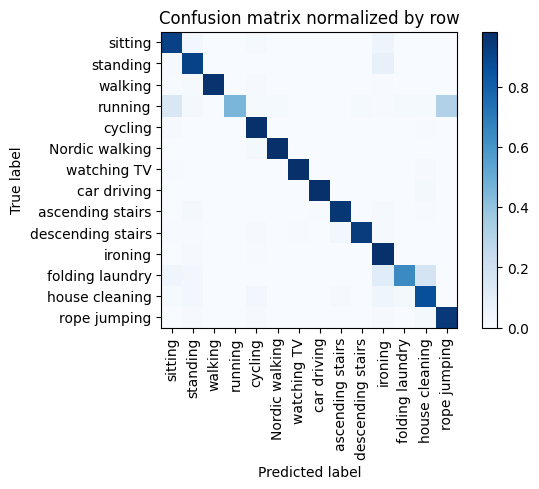

Training Epoch:  40%|████      | 6/15 [03:04<04:37, 30.88s/it]

Overall accuracy: 0.911

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.845      0.984      0.909      0.129        497|	 standing: 0.010,	cycling: 0.004,	
          walking       0.998      0.969      0.983      0.117        448|	 standing: 0.013,	cycling: 0.009,	
   Nordic walking       0.995      0.979      0.987      0.102        390|	 cycling: 0.015,	house cleaning: 0.003,	
   house cleaning       0.876      0.865      0.871      0.100        385|	 ironing: 0.042,	cycling: 0.023,	
         standing       0.882      0.912      0.897      0.092        353|	 ironing: 0.076,	sitting: 0.011,	
          sitting       0.855      0.915      0.884      0.086        329|	 ironing: 0.049,	standing: 0.024,	
          cycling       0.909      0.980      0.943      0.080        306|	 sitting: 0.010,	house cleaning: 0.007,	
 ascending stairs       0.955      0.955      0.955      0.052        201|	 standing: 0.020,	ironing: 


train: 100%|██████████| 242/242 [00:27<00:00,  8.77batch/s, loss=7.17, accuracy=0.906]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.17batch/s, loss=6.02]


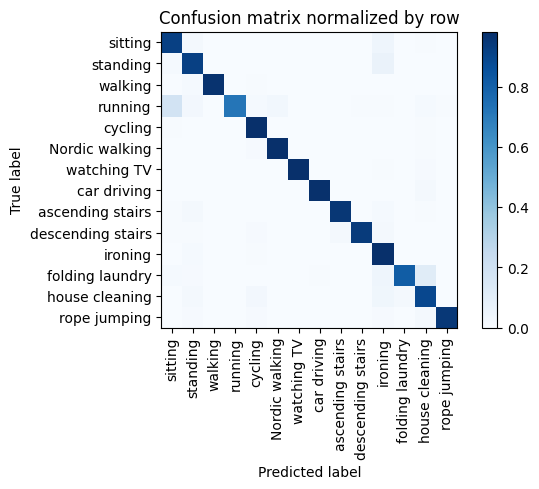

Training Epoch:  47%|████▋     | 7/15 [03:36<04:08, 31.06s/it]

Overall accuracy: 0.937

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.874      0.984      0.926      0.130        499|	 standing: 0.012,	cycling: 0.004,	
          walking       0.998      0.971      0.984      0.117        448|	 standing: 0.013,	cycling: 0.007,	
   Nordic walking       0.985      0.982      0.983      0.102        390|	 cycling: 0.008,	house cleaning: 0.005,	
   house cleaning       0.902      0.895      0.899      0.099        381|	 ironing: 0.037,	cycling: 0.026,	
         standing       0.897      0.922      0.909      0.093        358|	 ironing: 0.064,	sitting: 0.014,	
          sitting       0.871      0.921      0.895      0.086        329|	 ironing: 0.046,	standing: 0.021,	
          cycling       0.925      0.983      0.953      0.079        302|	 house cleaning: 0.007,	sitting: 0.007,	
 ascending stairs       0.979      0.955      0.967      0.052        200|	 standing: 0.020,	ironing: 


train: 100%|██████████| 242/242 [00:27<00:00,  8.88batch/s, loss=5.72, accuracy=0.984]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.15batch/s, loss=6.12]


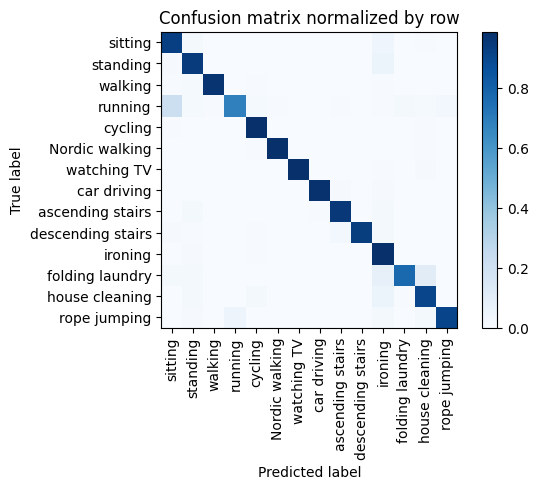

Training Epoch:  53%|█████▎    | 8/15 [04:07<03:37, 31.08s/it]

Overall accuracy: 0.936

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.859      0.986      0.918      0.130        500|	 standing: 0.010,	cycling: 0.004,	
          walking       0.995      0.971      0.983      0.117        449|	 standing: 0.013,	sitting: 0.007,	
   Nordic walking       0.997      0.985      0.991      0.102        390|	 house cleaning: 0.005,	cycling: 0.005,	
   house cleaning       0.909      0.904      0.907      0.098        376|	 ironing: 0.051,	standing: 0.019,	
         standing       0.900      0.941      0.920      0.092        354|	 ironing: 0.051,	sitting: 0.008,	
          sitting       0.855      0.927      0.890      0.086        330|	 ironing: 0.042,	standing: 0.021,	
          cycling       0.950      0.987      0.968      0.080        306|	 house cleaning: 0.007,	sitting: 0.007,	
 ascending stairs       0.965      0.955      0.960      0.052        200|	 ironing: 0.020,	standing:


train: 100%|██████████| 242/242 [00:27<00:00,  8.72batch/s, loss=6.26, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 16.72batch/s, loss=5.63]


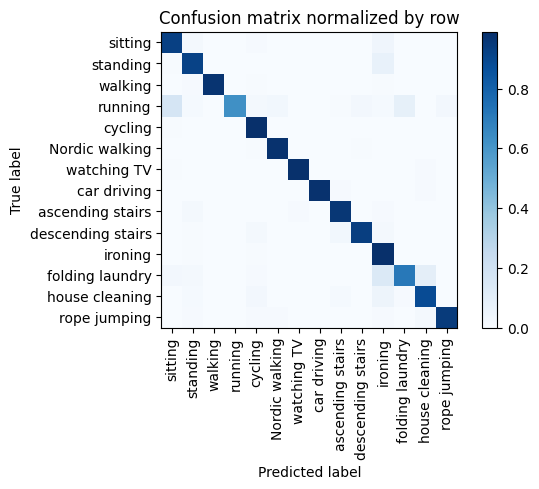

Training Epoch:  60%|██████    | 9/15 [04:39<03:07, 31.27s/it]

Overall accuracy: 0.928

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.834      0.990      0.905      0.129        496|	 cycling: 0.006,	standing: 0.004,	
          walking       0.998      0.973      0.985      0.116        447|	 standing: 0.011,	ironing: 0.004,	
   Nordic walking       0.985      0.979      0.982      0.102        390|	 descending stairs: 0.008,	cycling: 0.008,	
   house cleaning       0.928      0.884      0.906      0.099        380|	 ironing: 0.050,	cycling: 0.024,	
         standing       0.914      0.919      0.917      0.094        360|	 ironing: 0.075,	sitting: 0.006,	
          sitting       0.887      0.927      0.907      0.086        331|	 ironing: 0.042,	standing: 0.021,	
          cycling       0.912      0.987      0.948      0.079        305|	 sitting: 0.007,	house cleaning: 0.003,	
  folding laundry       0.887      0.712      0.790      0.052        198|	 ironing: 0.136,	house c


train: 100%|██████████| 242/242 [00:27<00:00,  8.91batch/s, loss=6.26, accuracy=0.844]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.80batch/s, loss=6.08]


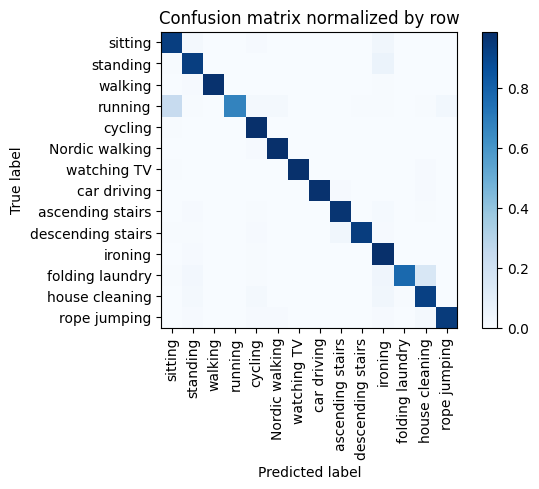

Training Epoch:  67%|██████▋   | 10/15 [05:09<02:35, 31.15s/it]

Overall accuracy: 0.940

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.886      0.988      0.934      0.129        497|	 standing: 0.008,	cycling: 0.004,	
          walking       0.998      0.980      0.989      0.116        446|	 standing: 0.011,	ironing: 0.004,	
   Nordic walking       0.990      0.985      0.987      0.103        394|	 cycling: 0.010,	house cleaning: 0.003,	
   house cleaning       0.898      0.926      0.912      0.099        379|	 ironing: 0.032,	cycling: 0.018,	
         standing       0.913      0.933      0.923      0.093        358|	 ironing: 0.061,	sitting: 0.006,	
          sitting       0.865      0.933      0.898      0.086        329|	 ironing: 0.033,	standing: 0.021,	
          cycling       0.923      0.987      0.954      0.079        304|	 sitting: 0.007,	house cleaning: 0.003,	
 ascending stairs       0.965      0.965      0.965      0.052        200|	 ironing: 0.015,	standing: 


train: 100%|██████████| 242/242 [00:27<00:00,  8.93batch/s, loss=6.05, accuracy=0.969]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.07batch/s, loss=6.28]


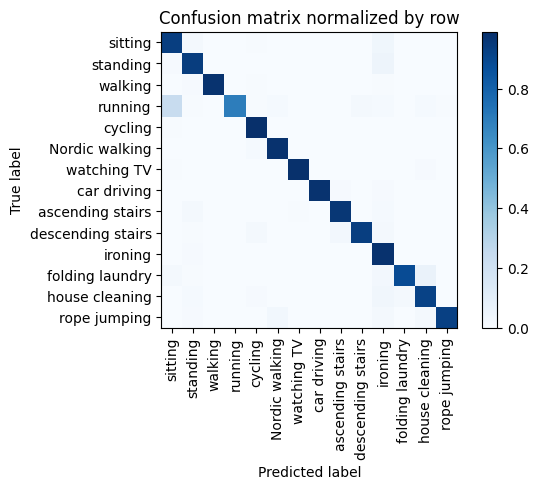

Training Epoch:  73%|███████▎  | 11/15 [05:40<02:04, 31.09s/it]

Overall accuracy: 0.945

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.886      0.982      0.931      0.128        490|	 standing: 0.010,	house cleaning: 0.002,	
          walking       0.998      0.978      0.988      0.116        445|	 standing: 0.011,	ironing: 0.004,	
   Nordic walking       0.987      0.982      0.985      0.103        394|	 cycling: 0.013,	house cleaning: 0.003,	
   house cleaning       0.941      0.919      0.930      0.100        383|	 ironing: 0.034,	folding laundry: 0.018,	
         standing       0.918      0.939      0.929      0.094        360|	 ironing: 0.050,	sitting: 0.011,	
          sitting       0.857      0.936      0.895      0.085        327|	 ironing: 0.037,	standing: 0.021,	
          cycling       0.944      0.990      0.966      0.079        305|	 sitting: 0.007,	house cleaning: 0.003,	
 ascending stairs       0.965      0.960      0.963      0.053        202|	 standing: 0


train: 100%|██████████| 242/242 [00:27<00:00,  8.94batch/s, loss=8.35, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.20batch/s, loss=5.24]


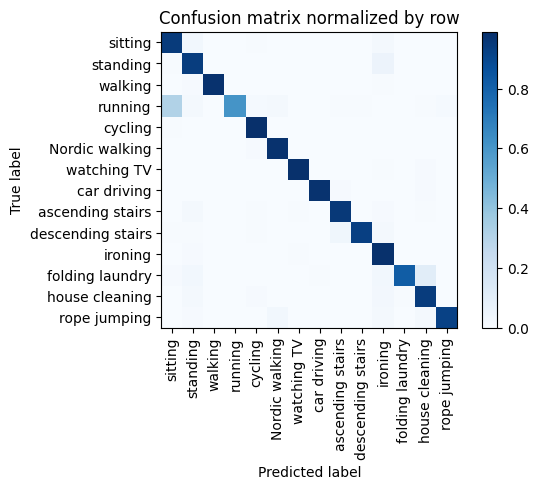

Training Epoch:  80%|████████  | 12/15 [06:11<01:33, 31.04s/it]

Overall accuracy: 0.942

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.902      0.986      0.942      0.129        494|	 standing: 0.008,	watching TV: 0.004,	
          walking       0.998      0.982      0.990      0.117        448|	 standing: 0.011,	ironing: 0.004,	
   Nordic walking       0.985      0.982      0.983      0.102        393|	 cycling: 0.010,	rope jumping: 0.003,	
   house cleaning       0.923      0.940      0.931      0.100        383|	 ironing: 0.026,	standing: 0.016,	
         standing       0.895      0.938      0.916      0.093        356|	 ironing: 0.056,	sitting: 0.006,	
          sitting       0.841      0.946      0.890      0.086        331|	 standing: 0.027,	ironing: 0.018,	
          cycling       0.953      0.990      0.971      0.079        305|	 sitting: 0.007,	house cleaning: 0.003,	
 ascending stairs       0.950      0.955      0.953      0.052        201|	 standing: 0.020,	ironin


train: 100%|██████████| 242/242 [00:27<00:00,  8.88batch/s, loss=6.65, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.89batch/s, loss=5.96]


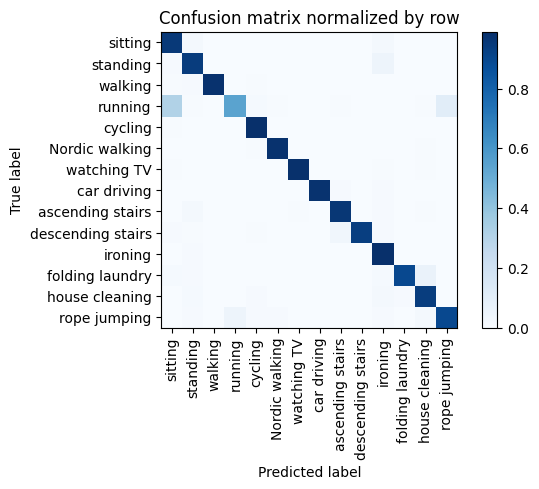

Training Epoch:  87%|████████▋ | 13/15 [06:42<01:02, 31.01s/it]

Overall accuracy: 0.943

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.918      0.988      0.952      0.130        498|	 standing: 0.008,	cycling: 0.002,	
          walking       0.998      0.980      0.989      0.116        446|	 standing: 0.011,	cycling: 0.004,	
   Nordic walking       0.995      0.982      0.988      0.102        392|	 cycling: 0.008,	house cleaning: 0.005,	
   house cleaning       0.945      0.940      0.942      0.099        381|	 ironing: 0.021,	standing: 0.013,	
         standing       0.918      0.942      0.930      0.093        359|	 ironing: 0.050,	sitting: 0.008,	
          sitting       0.826      0.954      0.885      0.085        328|	 ironing: 0.021,	standing: 0.021,	
          cycling       0.953      0.990      0.971      0.080        307|	 sitting: 0.007,	house cleaning: 0.003,	
 ascending stairs       0.955      0.960      0.957      0.052        199|	 standing: 0.020,	ironing:


train: 100%|██████████| 242/242 [00:27<00:00,  8.92batch/s, loss=6.47, accuracy=0.953]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.48batch/s, loss=4.93]


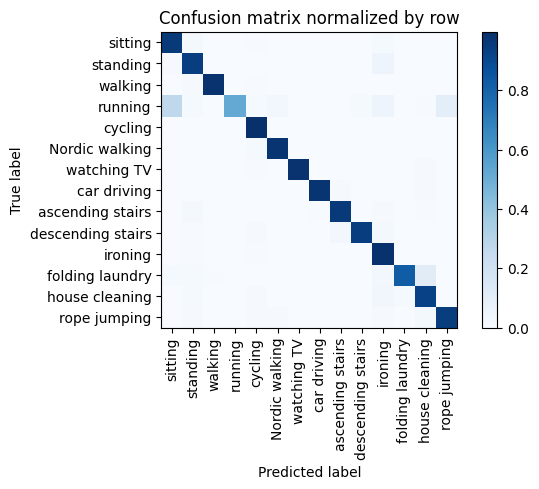

Training Epoch:  93%|█████████▎| 14/15 [07:13<00:30, 30.98s/it]

Overall accuracy: 0.940

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.897      0.988      0.940      0.129        496|	 standing: 0.006,	cycling: 0.004,	
          walking       0.995      0.982      0.989      0.116        445|	 standing: 0.009,	cycling: 0.007,	
   Nordic walking       0.987      0.979      0.983      0.102        390|	 cycling: 0.015,	rope jumping: 0.003,	
   house cleaning       0.917      0.929      0.923      0.099        380|	 ironing: 0.032,	folding laundry: 0.013,	
         standing       0.918      0.942      0.930      0.093        359|	 ironing: 0.050,	sitting: 0.008,	
          sitting       0.861      0.957      0.906      0.086        329|	 standing: 0.021,	ironing: 0.015,	
          cycling       0.930      0.997      0.962      0.080        308|	 house cleaning: 0.003,	rope jumping: 0.000,	
 ascending stairs       0.970      0.960      0.965      0.052        201|	 standing: 0.020


train: 100%|██████████| 242/242 [00:26<00:00,  8.97batch/s, loss=5.59, accuracy=0.938]


torch.Size([14, 400])



seen: 100%|██████████| 60/60 [00:03<00:00, 17.40batch/s, loss=5.64]


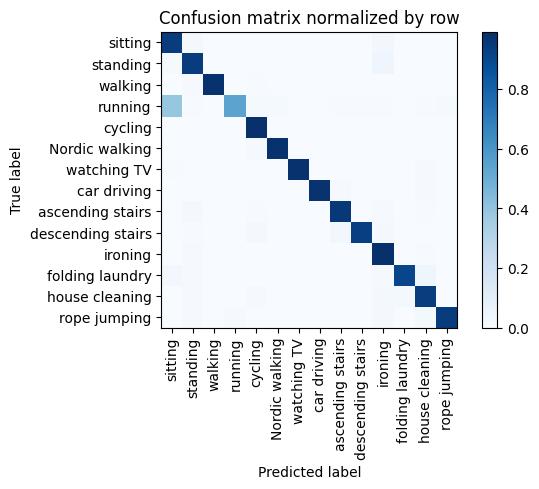

Overall accuracy: 0.946

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

          ironing       0.918      0.986      0.951      0.130        499|	 standing: 0.008,	house cleaning: 0.006,	
          walking       0.998      0.982      0.990      0.116        446|	 standing: 0.011,	cycling: 0.007,	
   Nordic walking       0.995      0.982      0.988      0.102        393|	 cycling: 0.013,	rope jumping: 0.003,	
   house cleaning       0.950      0.940      0.945      0.099        381|	 folding laundry: 0.018,	ironing: 0.018,	
         standing       0.918      0.947      0.932      0.093        357|	 ironing: 0.045,	sitting: 0.008,	
          sitting       0.804      0.945      0.869      0.086        329|	 ironing: 0.030,	standing: 0.021,	
          cycling       0.943      0.993      0.968      0.079        302|	 house cleaning: 0.003,	sitting: 0.003,	
 ascending stairs       0.965      0.960      0.962      0.052        200|	 standing: 0.0

unseen: 100%|██████████| 111/111 [00:06<00:00, 17.40batch/s, loss=14.8]


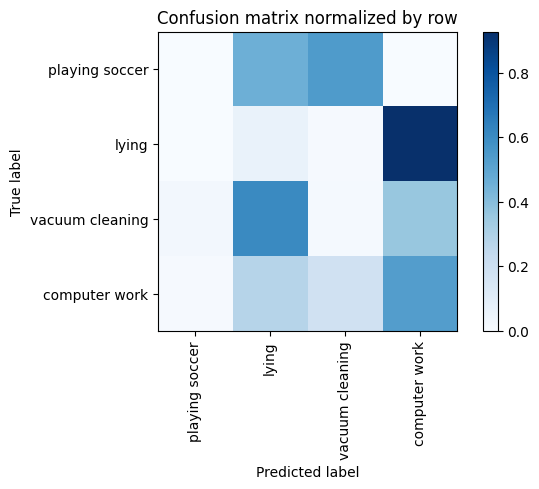

Overall accuracy: 0.249

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

  computer work       0.410      0.531      0.462      0.432       3071|	 lying: 0.277,	vacuum cleaning: 0.184,	
          lying       0.053      0.062      0.057      0.264       1874|	 computer work: 0.927,	vacuum cleaning: 0.009,	
vacuum cleaning       0.022      0.011      0.015      0.240       1702|	 lying: 0.605,	computer work: 0.359,	playing soccer: 0.025,	
 playing soccer       0.014      0.002      0.004      0.064        457|	 vacuum cleaning: 0.540,	lying: 0.457,	

----------------------------------------------------------------------------------------------------
    avg / total       0.197      0.249      0.219        1.0       7104|	      

{'accuracy': 0.24859234234234234, 'precision': 0.12457674541326183, 'recall': 0.15150573411949714, 'f1': 0.13450697946817403}
================ Fold-3 ================
Unseen Classes : ['cycling', 'running', 'Nordic walki

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 276/276 [00:30<00:00,  9.14batch/s, loss=12, accuracy=0.812]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.48batch/s, loss=13.1]


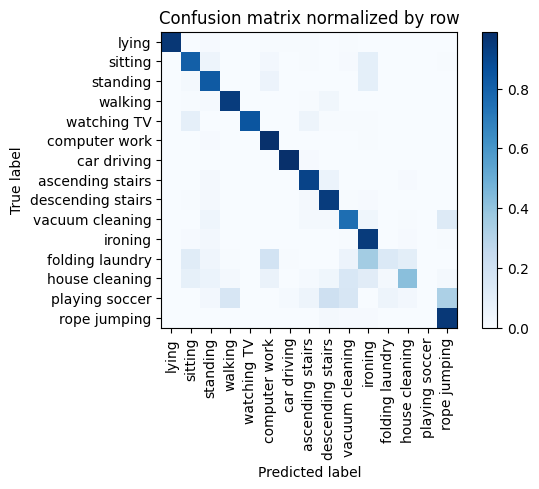

Training Epoch:   7%|▋         | 1/15 [00:34<08:03, 34.51s/it]

Overall accuracy: 0.819

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.875      0.983      0.926      0.143        633|	 standing: 0.009,	ironing: 0.006,	
          walking       0.958      0.940      0.949      0.109        482|	 descending stairs: 0.031,	standing: 0.012,	
          ironing       0.698      0.945      0.803      0.106        469|	 standing: 0.023,	sitting: 0.011,	
            lying       1.000      0.962      0.980      0.088        390|	 standing: 0.010,	vacuum cleaning: 0.008,	
          sitting       0.791      0.812      0.801      0.087        382|	 ironing: 0.092,	standing: 0.050,	
         standing       0.765      0.829      0.795      0.086        380|	 ironing: 0.092,	computer work: 0.055,	
   house cleaning       0.842      0.421      0.561      0.083        366|	 vacuum cleaning: 0.153,	ironing: 0.109,	
  vacuum cleaning       0.729      0.752      0.740      0.073        322|	 rope j


train: 100%|██████████| 276/276 [00:30<00:00,  8.97batch/s, loss=11.1, accuracy=0.875]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.58batch/s, loss=12.2]


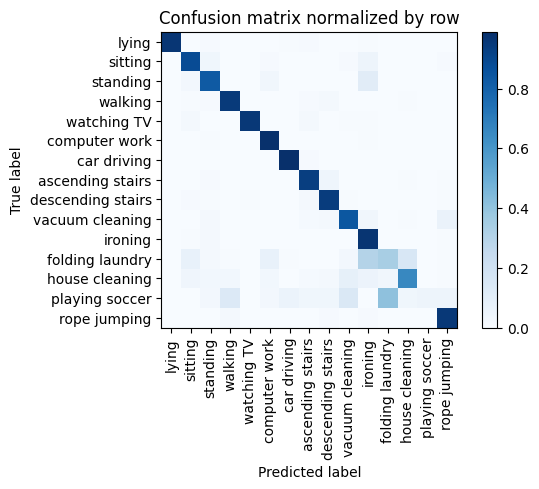

Training Epoch:  13%|█▎        | 2/15 [01:09<07:33, 34.85s/it]

Overall accuracy: 0.870

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.936      0.986      0.960      0.143        633|	 ironing: 0.006,	standing: 0.005,	
          walking       0.948      0.948      0.948      0.109        483|	 descending stairs: 0.021,	ascending stairs: 0.008,	
          ironing       0.748      0.968      0.844      0.106        468|	 standing: 0.017,	rope jumping: 0.004,	
            lying       1.000      0.967      0.983      0.088        390|	 ascending stairs: 0.010,	standing: 0.010,	
         standing       0.848      0.831      0.839      0.087        384|	 ironing: 0.112,	computer work: 0.031,	
          sitting       0.878      0.885      0.881      0.087        382|	 ironing: 0.047,	standing: 0.037,	
   house cleaning       0.866      0.655      0.746      0.083        365|	 vacuum cleaning: 0.085,	ironing: 0.055,	
  vacuum cleaning       0.831      0.842      0.836      0.073      


train: 100%|██████████| 276/276 [00:30<00:00,  8.95batch/s, loss=9.98, accuracy=0.891]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:04<00:00, 16.76batch/s, loss=10.9]


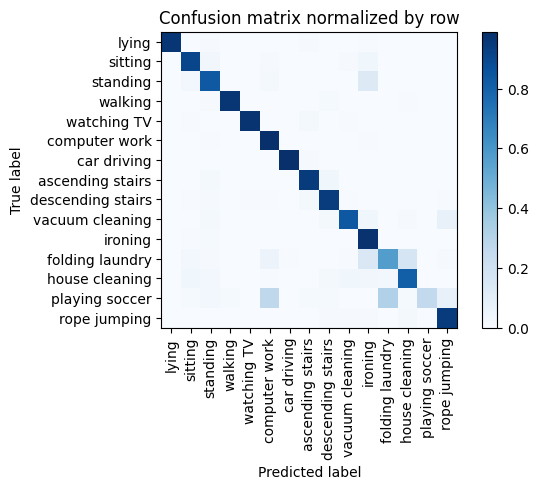

Training Epoch:  20%|██        | 3/15 [01:44<07:00, 35.07s/it]

Overall accuracy: 0.901

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.930      0.987      0.958      0.144        634|	 ironing: 0.006,	standing: 0.005,	
          walking       0.996      0.965      0.980      0.109        482|	 descending stairs: 0.015,	standing: 0.008,	
          ironing       0.794      0.977      0.876      0.106        469|	 standing: 0.015,	sitting: 0.004,	
            lying       1.000      0.964      0.982      0.088        387|	 ascending stairs: 0.010,	standing: 0.010,	
         standing       0.856      0.834      0.845      0.087        385|	 ironing: 0.125,	sitting: 0.023,	
          sitting       0.908      0.906      0.907      0.086        381|	 ironing: 0.037,	standing: 0.031,	
   house cleaning       0.881      0.809      0.843      0.083        366|	 vacuum cleaning: 0.038,	sitting: 0.038,	
  vacuum cleaning       0.925      0.839      0.879      0.073        322|	 rope jumpin


train: 100%|██████████| 276/276 [00:31<00:00,  8.87batch/s, loss=9.7, accuracy=0.828]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.42batch/s, loss=9.12]


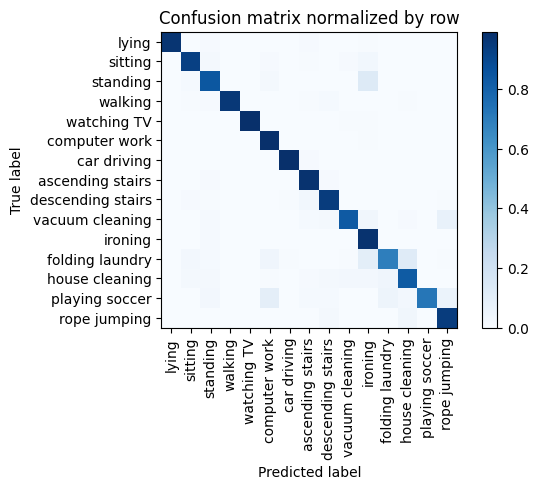

Training Epoch:  27%|██▋       | 4/15 [02:20<06:27, 35.21s/it]

Overall accuracy: 0.921

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.956      0.992      0.974      0.144        634|	 ironing: 0.005,	sitting: 0.003,	
          walking       0.998      0.961      0.979      0.109        483|	 descending stairs: 0.014,	standing: 0.008,	
          ironing       0.817      0.979      0.890      0.106        469|	 standing: 0.013,	rope jumping: 0.002,	
            lying       1.000      0.969      0.984      0.088        390|	 ascending stairs: 0.010,	standing: 0.010,	
         standing       0.892      0.843      0.867      0.087        383|	 ironing: 0.125,	computer work: 0.018,	
          sitting       0.939      0.929      0.934      0.086        380|	 ironing: 0.029,	standing: 0.016,	
   house cleaning       0.907      0.828      0.866      0.083        366|	 folding laundry: 0.041,	ironing: 0.025,	
  vacuum cleaning       0.951      0.833      0.888      0.073        323|	 r


train: 100%|██████████| 276/276 [00:31<00:00,  8.89batch/s, loss=8.14, accuracy=0.906]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:04<00:00, 17.22batch/s, loss=9.95]


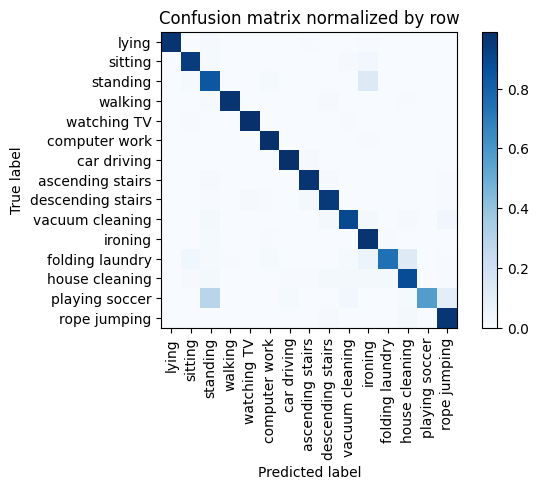

Training Epoch:  33%|███▎      | 5/15 [02:55<05:52, 35.28s/it]

Overall accuracy: 0.932

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.980      0.991      0.985      0.143        632|	 ironing: 0.005,	sitting: 0.003,	
          walking       0.996      0.973      0.984      0.109        483|	 descending stairs: 0.010,	standing: 0.008,	
          ironing       0.840      0.970      0.900      0.106        470|	 standing: 0.015,	computer work: 0.006,	
            lying       1.000      0.972      0.986      0.088        390|	 standing: 0.010,	ascending stairs: 0.008,	
          sitting       0.950      0.943      0.946      0.087        383|	 ironing: 0.026,	standing: 0.013,	
         standing       0.843      0.843      0.843      0.087        382|	 ironing: 0.131,	computer work: 0.013,	
   house cleaning       0.917      0.882      0.899      0.082        364|	 vacuum cleaning: 0.019,	descending stairs: 0.019,	
  vacuum cleaning       0.947      0.897      0.922      0.073    


train: 100%|██████████| 276/276 [00:31<00:00,  8.88batch/s, loss=8.23, accuracy=0.922]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.86batch/s, loss=8.2]


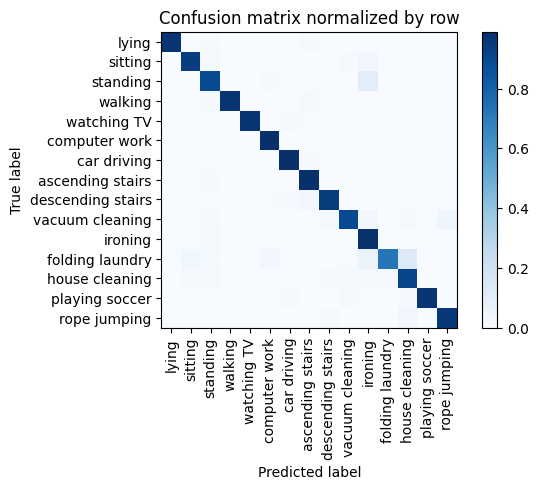

Training Epoch:  40%|████      | 6/15 [03:31<05:17, 35.30s/it]

Overall accuracy: 0.942

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.980      0.989      0.984      0.144        634|	 sitting: 0.005,	playing soccer: 0.003,	
          walking       0.998      0.973      0.985      0.109        483|	 ascending stairs: 0.008,	standing: 0.008,	
          ironing       0.848      0.977      0.908      0.106        469|	 standing: 0.017,	computer work: 0.006,	
            lying       1.000      0.972      0.986      0.088        390|	 standing: 0.013,	ascending stairs: 0.010,	
          sitting       0.962      0.935      0.948      0.087        382|	 ironing: 0.031,	standing: 0.016,	
         standing       0.896      0.885      0.890      0.086        381|	 ironing: 0.105,	computer work: 0.010,	
   house cleaning       0.912      0.907      0.910      0.083        367|	 standing: 0.019,	ironing: 0.016,	
  vacuum cleaning       0.963      0.888      0.924      0.073        321|	 r


train: 100%|██████████| 276/276 [00:31<00:00,  8.83batch/s, loss=8.05, accuracy=0.938]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.60batch/s, loss=7.46]


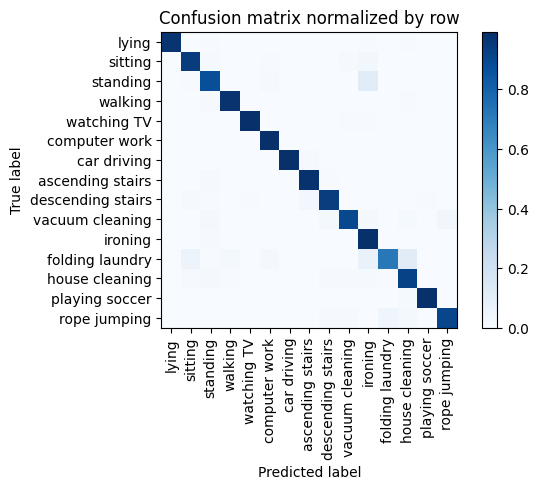

Training Epoch:  47%|████▋     | 7/15 [04:06<04:43, 35.40s/it]

Overall accuracy: 0.947

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.983      0.994      0.988      0.144        635|	 ironing: 0.003,	sitting: 0.003,	
          walking       0.987      0.979      0.983      0.109        483|	 standing: 0.008,	house cleaning: 0.004,	
          ironing       0.851      0.987      0.914      0.106        468|	 standing: 0.011,	computer work: 0.002,	
            lying       1.000      0.972      0.986      0.088        390|	 standing: 0.008,	house cleaning: 0.005,	
         standing       0.913      0.875      0.894      0.087        384|	 ironing: 0.109,	computer work: 0.010,	
          sitting       0.940      0.945      0.942      0.086        381|	 ironing: 0.024,	standing: 0.013,	
   house cleaning       0.918      0.921      0.919      0.083        365|	 standing: 0.016,	ironing: 0.014,	
  vacuum cleaning       0.973      0.898      0.934      0.073        322|	 rope jumping


train: 100%|██████████| 276/276 [00:31<00:00,  8.87batch/s, loss=7.97, accuracy=0.906]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:04<00:00, 17.06batch/s, loss=7.6] 


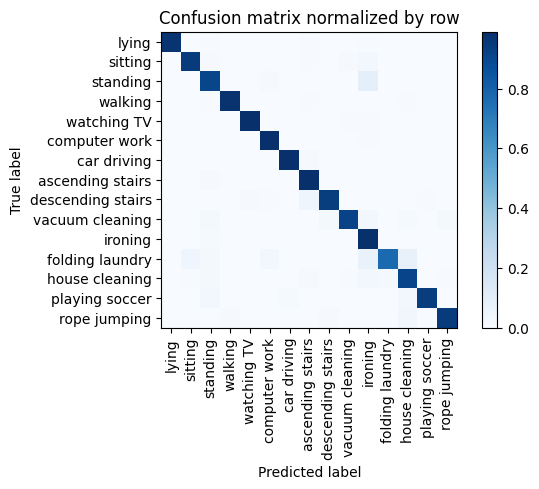

Training Epoch:  53%|█████▎    | 8/15 [04:42<04:08, 35.43s/it]

Overall accuracy: 0.950

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.984      0.990      0.987      0.143        631|	 ironing: 0.005,	playing soccer: 0.003,	
          walking       0.996      0.975      0.985      0.109        483|	 house cleaning: 0.006,	ascending stairs: 0.006,	
          ironing       0.851      0.987      0.914      0.106        467|	 standing: 0.013,	rope jumping: 0.000,	
            lying       1.000      0.974      0.987      0.088        390|	 ascending stairs: 0.008,	standing: 0.008,	
         standing       0.913      0.904      0.909      0.087        385|	 ironing: 0.088,	computer work: 0.008,	
          sitting       0.973      0.945      0.959      0.087        382|	 ironing: 0.029,	vacuum cleaning: 0.008,	
   house cleaning       0.930      0.910      0.920      0.083        367|	 ironing: 0.025,	folding laundry: 0.016,	
  vacuum cleaning       0.980      0.913      0.946      0


train: 100%|██████████| 276/276 [00:30<00:00,  9.04batch/s, loss=8.77, accuracy=0.922]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:04<00:00, 16.62batch/s, loss=7.01]


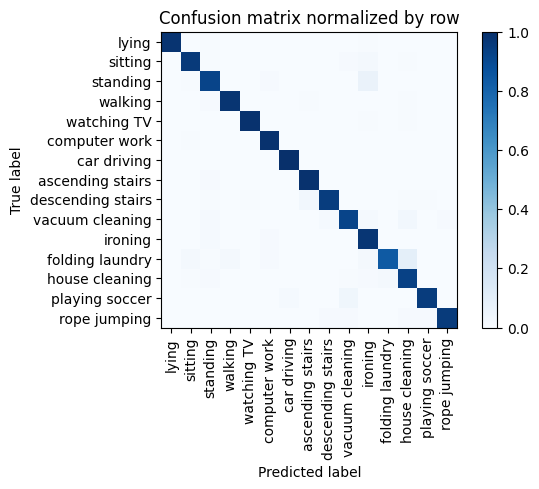

Training Epoch:  60%|██████    | 9/15 [05:17<03:31, 35.31s/it]

Overall accuracy: 0.959

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.981      0.989      0.985      0.144        634|	 sitting: 0.005,	playing soccer: 0.003,	
          walking       0.992      0.977      0.984      0.109        481|	 standing: 0.008,	house cleaning: 0.006,	
          ironing       0.905      0.976      0.939      0.106        466|	 standing: 0.015,	computer work: 0.009,	
            lying       0.997      0.982      0.990      0.088        389|	 standing: 0.008,	ironing: 0.005,	
         standing       0.926      0.919      0.923      0.087        383|	 ironing: 0.065,	computer work: 0.010,	
          sitting       0.973      0.958      0.966      0.087        382|	 ironing: 0.016,	vacuum cleaning: 0.008,	
   house cleaning       0.907      0.932      0.919      0.083        367|	 folding laundry: 0.022,	ironing: 0.011,	
  vacuum cleaning       0.971      0.920      0.944      0.073        323|


train: 100%|██████████| 276/276 [00:30<00:00,  9.10batch/s, loss=8.82, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:04<00:00, 16.11batch/s, loss=8.43]


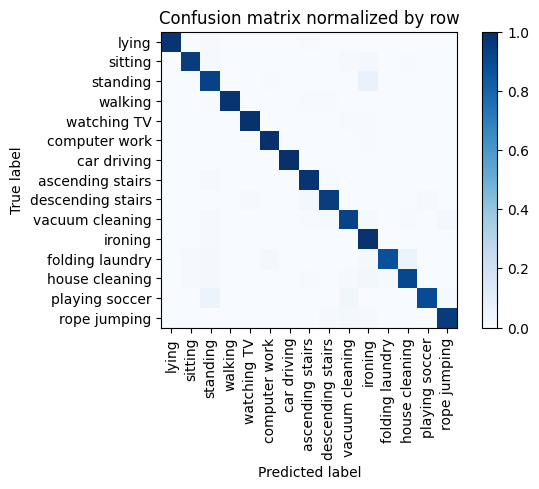

Training Epoch:  67%|██████▋   | 10/15 [05:52<02:56, 35.23s/it]

Overall accuracy: 0.959

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.987      0.994      0.991      0.143        633|	 ironing: 0.005,	sitting: 0.002,	
          walking       0.998      0.979      0.988      0.108        479|	 ascending stairs: 0.006,	standing: 0.006,	
          ironing       0.889      0.987      0.935      0.106        469|	 standing: 0.013,	rope jumping: 0.000,	
            lying       1.000      0.977      0.988      0.089        391|	 standing: 0.013,	ascending stairs: 0.005,	
         standing       0.906      0.927      0.916      0.087        383|	 ironing: 0.068,	computer work: 0.005,	
          sitting       0.984      0.953      0.968      0.087        382|	 ironing: 0.018,	vacuum cleaning: 0.008,	
   house cleaning       0.962      0.907      0.934      0.083        365|	 ironing: 0.030,	standing: 0.016,	
  vacuum cleaning       0.961      0.926      0.943      0.073        323|	 ro


train: 100%|██████████| 276/276 [00:34<00:00,  7.90batch/s, loss=7.98, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.26batch/s, loss=7.3] 


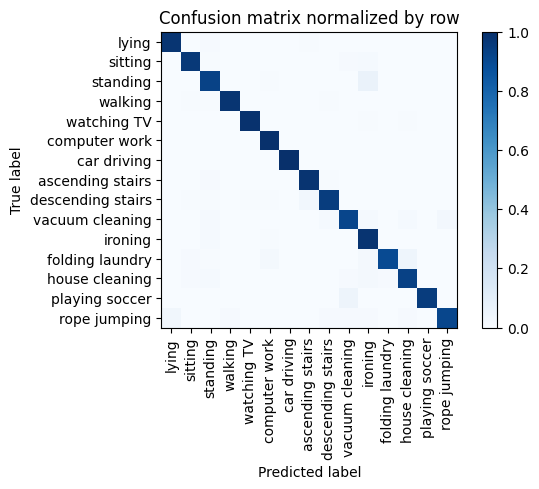

Training Epoch:  73%|███████▎  | 11/15 [06:31<02:26, 36.51s/it]

Overall accuracy: 0.962

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.984      0.995      0.990      0.143        632|	 ironing: 0.003,	sitting: 0.002,	
          walking       0.996      0.977      0.986      0.109        483|	 descending stairs: 0.006,	standing: 0.006,	
          ironing       0.900      0.983      0.940      0.106        469|	 standing: 0.013,	computer work: 0.004,	
            lying       0.992      0.977      0.984      0.088        389|	 standing: 0.010,	ascending stairs: 0.005,	
         standing       0.927      0.927      0.927      0.087        383|	 ironing: 0.065,	computer work: 0.005,	
          sitting       0.968      0.963      0.966      0.087        382|	 ironing: 0.013,	vacuum cleaning: 0.008,	
   house cleaning       0.955      0.932      0.943      0.083        365|	 ironing: 0.016,	standing: 0.014,	
  vacuum cleaning       0.964      0.916      0.940      0.073        323|	 


train: 100%|██████████| 276/276 [00:31<00:00,  8.72batch/s, loss=8.86, accuracy=0.922]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.53batch/s, loss=6.9]


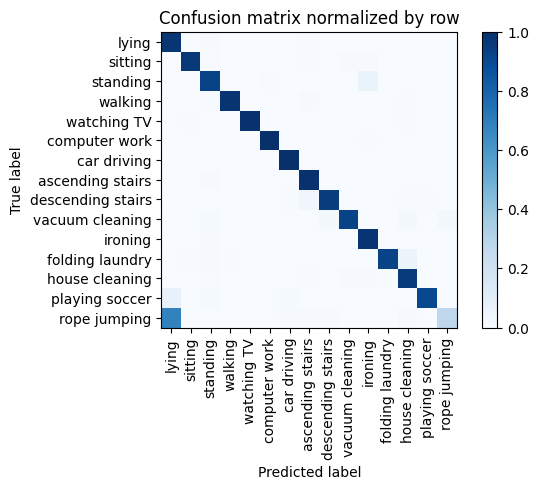

Training Epoch:  80%|████████  | 12/15 [07:07<01:49, 36.34s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.994      0.994      0.143        633|	 ironing: 0.005,	sitting: 0.002,	
          walking       0.996      0.977      0.986      0.110        484|	 ascending stairs: 0.008,	house cleaning: 0.006,	
          ironing       0.927      0.983      0.954      0.106        467|	 standing: 0.011,	rope jumping: 0.002,	
            lying       0.848      0.974      0.907      0.088        390|	 standing: 0.010,	ascending stairs: 0.008,	
         standing       0.934      0.927      0.931      0.087        383|	 ironing: 0.065,	computer work: 0.005,	
          sitting       0.984      0.969      0.976      0.087        382|	 ironing: 0.010,	vacuum cleaning: 0.008,	
   house cleaning       0.938      0.956      0.947      0.083        365|	 ironing: 0.008,	vacuum cleaning: 0.008,	
  vacuum cleaning       0.980      0.926      0.952      0.073   


train: 100%|██████████| 276/276 [00:31<00:00,  8.88batch/s, loss=7.93, accuracy=0.828]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.31batch/s, loss=7.93]


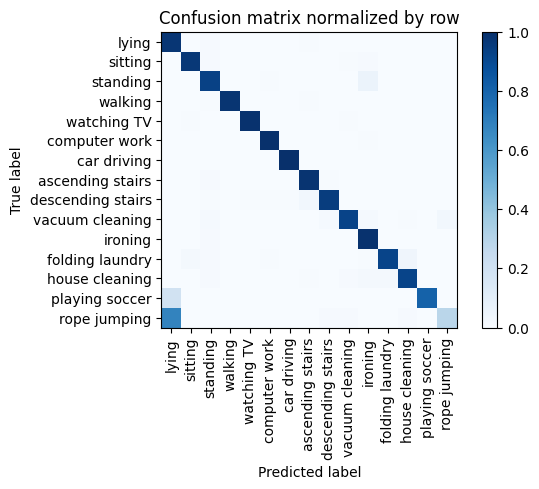

Training Epoch:  87%|████████▋ | 13/15 [07:43<01:12, 36.07s/it]

Overall accuracy: 0.949

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.991      0.995      0.993      0.143        633|	 ironing: 0.005,	rope jumping: 0.000,	
          walking       0.998      0.979      0.989      0.109        483|	 ascending stairs: 0.006,	standing: 0.006,	
          ironing       0.914      0.989      0.950      0.105        464|	 standing: 0.011,	rope jumping: 0.000,	
            lying       0.830      0.974      0.896      0.089        391|	 standing: 0.010,	ascending stairs: 0.008,	
         standing       0.930      0.932      0.931      0.087        385|	 ironing: 0.060,	computer work: 0.005,	
          sitting       0.981      0.969      0.975      0.086        381|	 ironing: 0.010,	standing: 0.008,	
   house cleaning       0.968      0.921      0.944      0.083        367|	 folding laundry: 0.022,	ironing: 0.019,	
  vacuum cleaning       0.977      0.925      0.951      0.073        322


train: 100%|██████████| 276/276 [00:31<00:00,  8.83batch/s, loss=7.64, accuracy=0.859]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.75batch/s, loss=7.44]


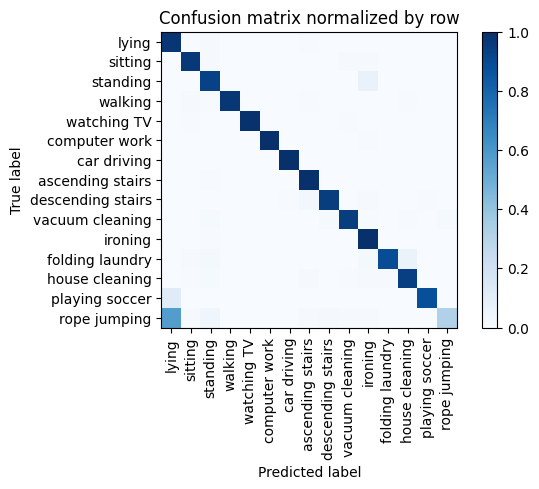

Training Epoch:  93%|█████████▎| 14/15 [08:18<00:35, 35.90s/it]

Overall accuracy: 0.952

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.995      0.996      0.143        633|	 ironing: 0.005,	rope jumping: 0.000,	
          walking       0.998      0.971      0.984      0.109        482|	 sitting: 0.008,	ascending stairs: 0.006,	
          ironing       0.914      0.994      0.952      0.106        468|	 standing: 0.006,	rope jumping: 0.000,	
            lying       0.860      0.974      0.913      0.088        390|	 standing: 0.010,	ascending stairs: 0.008,	
         standing       0.922      0.930      0.926      0.087        383|	 ironing: 0.068,	computer work: 0.003,	
          sitting       0.974      0.969      0.971      0.087        382|	 ironing: 0.008,	vacuum cleaning: 0.008,	
   house cleaning       0.953      0.940      0.947      0.083        367|	 standing: 0.014,	ironing: 0.011,	
  vacuum cleaning       0.978      0.947      0.962      0.073        322|


train: 100%|██████████| 276/276 [00:31<00:00,  8.80batch/s, loss=8.55, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 69/69 [00:03<00:00, 17.74batch/s, loss=6.98]


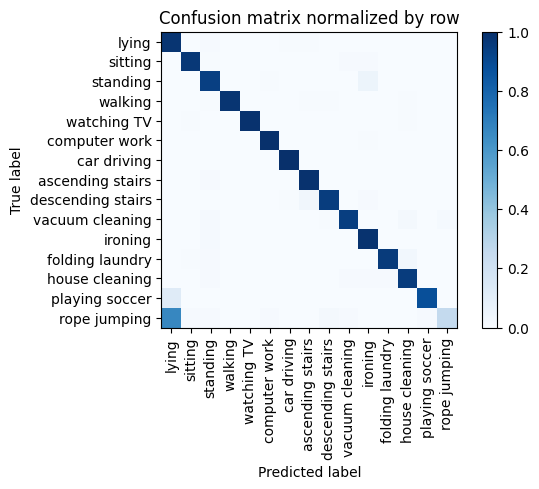

Overall accuracy: 0.955

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.994      0.995      0.994      0.143        633|	 ironing: 0.005,	rope jumping: 0.000,	
          walking       0.998      0.979      0.988      0.109        482|	 descending stairs: 0.006,	standing: 0.006,	
          ironing       0.935      0.985      0.960      0.106        469|	 standing: 0.013,	rope jumping: 0.002,	
            lying       0.843      0.977      0.905      0.088        389|	 standing: 0.010,	ascending stairs: 0.005,	
         standing       0.928      0.940      0.934      0.087        383|	 ironing: 0.052,	computer work: 0.005,	
          sitting       0.987      0.969      0.978      0.087        382|	 ironing: 0.008,	vacuum cleaning: 0.008,	
   house cleaning       0.953      0.951      0.952      0.083        366|	 standing: 0.011,	folding laundry: 0.008,	
  vacuum cleaning       0.977      0.944      0.961      0.073  

unseen: 100%|██████████| 68/68 [00:03<00:00, 18.27batch/s, loss=4.81]


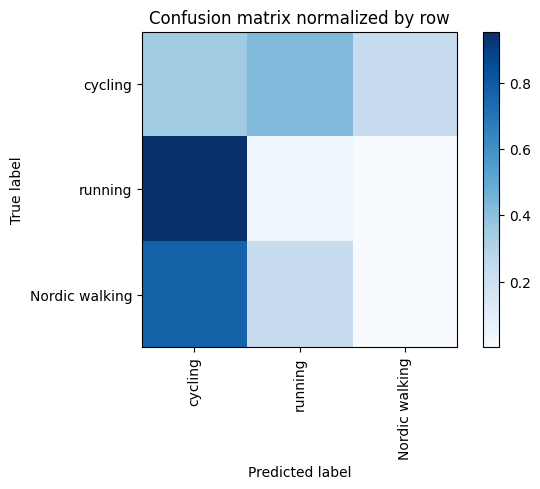

Overall accuracy: 0.137

                 precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

Nordic walking       0.008      0.002      0.003      0.419       1824|	 cycling: 0.771,	running: 0.228,	
       cycling       0.193      0.349      0.249      0.364       1583|	 running: 0.424,	Nordic walking: 0.227,	
       running       0.036      0.042      0.039      0.217        945|	 cycling: 0.956,	Nordic walking: 0.002,	

----------------------------------------------------------------------------------------------------
   avg / total       0.081      0.137      0.100        1.0       4352|	      

{'accuracy': 0.13694852941176472, 'precision': 0.0789957534458579, 'recall': 0.13110316054460805, 'f1': 0.0967299365937927}
================ Fold-4 ================
Unseen Classes : ['ironing', 'car driving', 'folding laundry']
per class count :  {'lying': 8, 'sitting': 8, 'standing': 8, 'walking': 8, 'running': 6, 'cycling': 7, 'Nordic walking': 7, 'watching TV': 1, '

Training Epoch:   0%|          | 0/15 [00:00<?, ?it/s]

torch.Size([15, 400])



train: 100%|██████████| 283/283 [00:34<00:00,  8.22batch/s, loss=12.7, accuracy=0.875]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.36batch/s, loss=9.96]


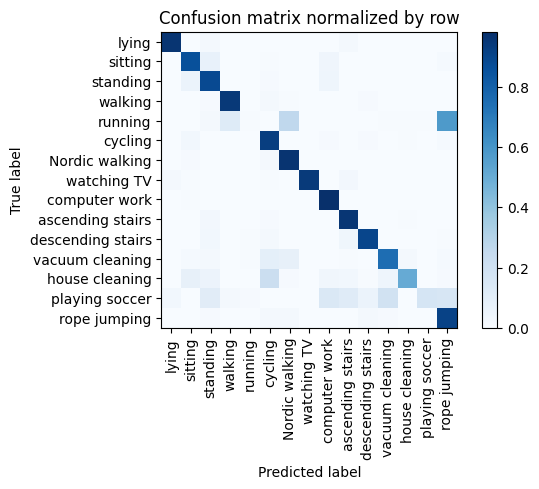

Training Epoch:   7%|▋         | 1/15 [00:39<09:12, 39.43s/it]

Overall accuracy: 0.838

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.906      0.984      0.944      0.129        580|	 sitting: 0.005,	cycling: 0.003,	
          walking       0.952      0.948      0.950      0.108        482|	 cycling: 0.023,	descending stairs: 0.010,	
   Nordic walking       0.832      0.967      0.894      0.089        398|	 cycling: 0.020,	sitting: 0.010,	
            lying       0.982      0.961      0.971      0.087        389|	 standing: 0.021,	ascending stairs: 0.015,	
         standing       0.777      0.885      0.828      0.083        374|	 sitting: 0.061,	computer work: 0.043,	
          sitting       0.811      0.863      0.836      0.080        358|	 standing: 0.075,	computer work: 0.039,	
   house cleaning       0.946      0.507      0.660      0.077        347|	 cycling: 0.219,	sitting: 0.081,	
  vacuum cleaning       0.859      0.752      0.802      0.070        315|	 cycling: 0


train: 100%|██████████| 283/283 [00:51<00:00,  5.48batch/s, loss=11, accuracy=0.922]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.66batch/s, loss=9.69]


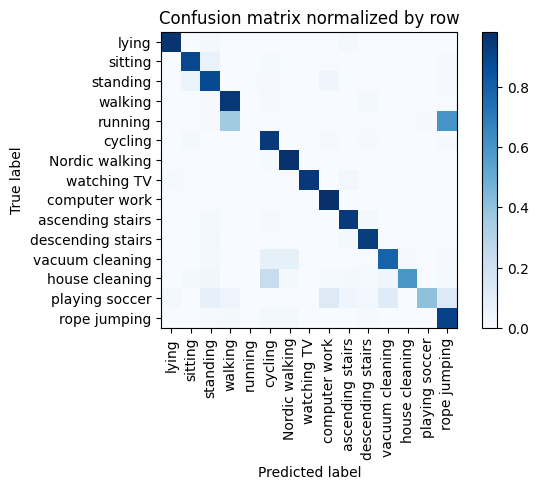

Training Epoch:  13%|█▎        | 2/15 [01:36<10:45, 49.65s/it]

Overall accuracy: 0.859

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.938      0.985      0.961      0.131        588|	 standing: 0.005,	house cleaning: 0.003,	
          walking       0.870      0.956      0.911      0.108        482|	 descending stairs: 0.017,	cycling: 0.010,	
   Nordic walking       0.904      0.975      0.938      0.089        397|	 cycling: 0.015,	sitting: 0.008,	
            lying       0.989      0.964      0.976      0.086        386|	 standing: 0.018,	ascending stairs: 0.016,	
         standing       0.814      0.883      0.847      0.084        376|	 sitting: 0.051,	computer work: 0.043,	
          sitting       0.894      0.894      0.894      0.080        359|	 standing: 0.067,	cycling: 0.014,	
   house cleaning       0.971      0.595      0.738      0.077        343|	 cycling: 0.233,	vacuum cleaning: 0.041,	
  vacuum cleaning       0.893      0.789      0.838      0.071        318|	 


train: 100%|██████████| 283/283 [00:35<00:00,  8.04batch/s, loss=9.02, accuracy=0.828]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.99batch/s, loss=9.23]


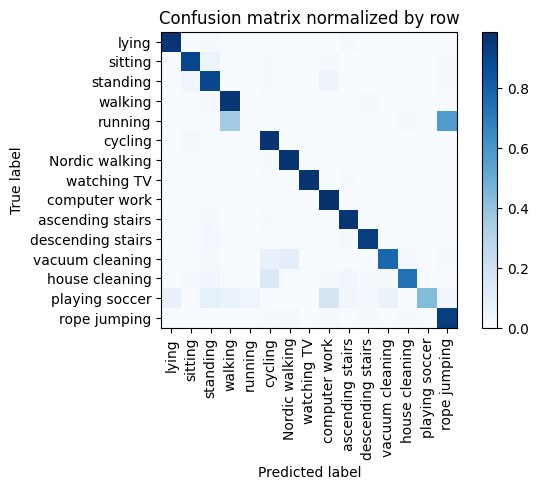

Training Epoch:  20%|██        | 3/15 [02:16<09:03, 45.28s/it]

Overall accuracy: 0.877

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.928      0.988      0.957      0.131        588|	 standing: 0.005,	cycling: 0.003,	
          walking       0.872      0.959      0.913      0.108        484|	 descending stairs: 0.012,	standing: 0.008,	
   Nordic walking       0.915      0.970      0.942      0.089        400|	 cycling: 0.013,	descending stairs: 0.007,	
            lying       0.979      0.964      0.972      0.087        390|	 ascending stairs: 0.015,	standing: 0.015,	
         standing       0.830      0.899      0.863      0.084        376|	 computer work: 0.048,	sitting: 0.032,	
          sitting       0.910      0.902      0.906      0.080        357|	 standing: 0.062,	cycling: 0.014,	
   house cleaning       0.951      0.737      0.831      0.077        346|	 cycling: 0.136,	ascending stairs: 0.032,	
  vacuum cleaning       0.949      0.777      0.855      0.070        3


train: 100%|██████████| 283/283 [00:40<00:00,  6.98batch/s, loss=9.26, accuracy=0.906]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.37batch/s, loss=7.2]


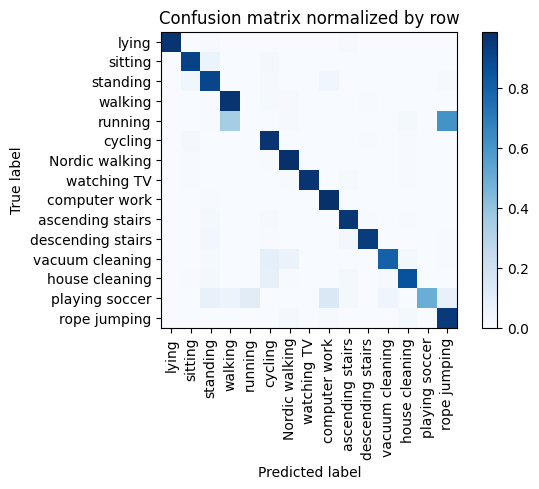

Training Epoch:  27%|██▋       | 4/15 [03:02<08:20, 45.46s/it]

Overall accuracy: 0.892

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.946      0.986      0.966      0.132        590|	 standing: 0.005,	house cleaning: 0.003,	
          walking       0.876      0.965      0.918      0.108        482|	 cycling: 0.012,	Nordic walking: 0.008,	
   Nordic walking       0.926      0.982      0.953      0.088        396|	 sitting: 0.008,	house cleaning: 0.005,	
            lying       1.000      0.969      0.984      0.087        388|	 ascending stairs: 0.010,	standing: 0.010,	
         standing       0.855      0.905      0.879      0.084        378|	 computer work: 0.037,	sitting: 0.037,	
          sitting       0.924      0.916      0.920      0.080        358|	 standing: 0.059,	cycling: 0.017,	
   house cleaning       0.931      0.860      0.894      0.077        344|	 cycling: 0.078,	ascending stairs: 0.017,	
  vacuum cleaning       0.973      0.801      0.879      0.070        3


train: 100%|██████████| 283/283 [00:43<00:00,  6.49batch/s, loss=7.5, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.54batch/s, loss=7.57]


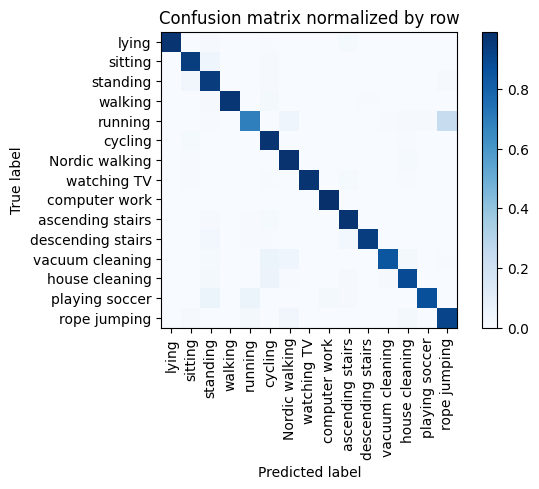

Training Epoch:  33%|███▎      | 5/15 [03:51<07:50, 47.00s/it]

Overall accuracy: 0.938

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.991      0.991      0.131        588|	 cycling: 0.003,	house cleaning: 0.002,	
          walking       1.000      0.967      0.983      0.108        482|	 cycling: 0.017,	standing: 0.008,	
   Nordic walking       0.935      0.977      0.956      0.089        399|	 house cleaning: 0.015,	sitting: 0.008,	
            lying       0.997      0.969      0.983      0.087        391|	 ascending stairs: 0.013,	standing: 0.010,	
         standing       0.877      0.944      0.909      0.084        377|	 sitting: 0.034,	rope jumping: 0.008,	
          sitting       0.930      0.941      0.936      0.079        355|	 standing: 0.045,	cycling: 0.011,	
   house cleaning       0.936      0.884      0.909      0.077        345|	 cycling: 0.055,	standing: 0.023,	
  vacuum cleaning       0.982      0.847      0.909      0.070        314|	 cycling: 0.


train: 100%|██████████| 283/283 [00:45<00:00,  6.23batch/s, loss=8.03, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 16.63batch/s, loss=6.44]


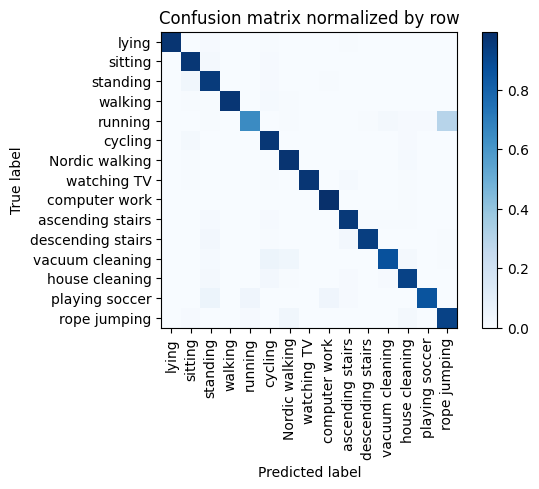

Training Epoch:  40%|████      | 6/15 [04:41<07:12, 48.02s/it]

Overall accuracy: 0.943

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.985      0.995      0.990      0.131        587|	 house cleaning: 0.005,	rope jumping: 0.000,	
          walking       1.000      0.971      0.985      0.108        484|	 cycling: 0.014,	standing: 0.006,	
   Nordic walking       0.954      0.978      0.965      0.089        400|	 house cleaning: 0.013,	sitting: 0.005,	
            lying       1.000      0.972      0.986      0.087        391|	 standing: 0.010,	ascending stairs: 0.008,	
         standing       0.902      0.949      0.925      0.084        376|	 sitting: 0.032,	cycling: 0.011,	
          sitting       0.932      0.966      0.949      0.080        357|	 standing: 0.022,	cycling: 0.008,	
   house cleaning       0.935      0.922      0.928      0.077        344|	 cycling: 0.026,	standing: 0.017,	
  vacuum cleaning       0.972      0.869      0.918      0.070        314|	 cycling: 0.


train: 100%|██████████| 283/283 [00:44<00:00,  6.37batch/s, loss=7.22, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.55batch/s, loss=5.75]


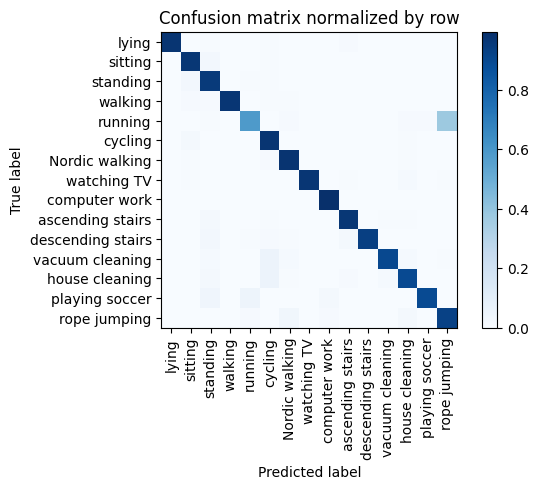

Training Epoch:  47%|████▋     | 7/15 [05:31<06:27, 48.46s/it]

Overall accuracy: 0.943

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.990      0.995      0.992      0.130        584|	 cycling: 0.003,	house cleaning: 0.002,	
          walking       1.000      0.971      0.985      0.108        482|	 sitting: 0.010,	standing: 0.008,	
   Nordic walking       0.963      0.978      0.970      0.090        401|	 cycling: 0.010,	house cleaning: 0.005,	
            lying       1.000      0.972      0.986      0.087        388|	 ascending stairs: 0.010,	standing: 0.008,	
         standing       0.900      0.955      0.927      0.085        379|	 sitting: 0.026,	cycling: 0.005,	
          sitting       0.932      0.966      0.949      0.079        356|	 standing: 0.025,	cycling: 0.006,	
   house cleaning       0.950      0.894      0.921      0.076        341|	 cycling: 0.056,	standing: 0.018,	
  vacuum cleaning       0.979      0.898      0.937      0.070        315|	 cycling: 0.057,	


train: 100%|██████████| 283/283 [00:53<00:00,  5.25batch/s, loss=6.11, accuracy=0.969]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 16.70batch/s, loss=6.17]


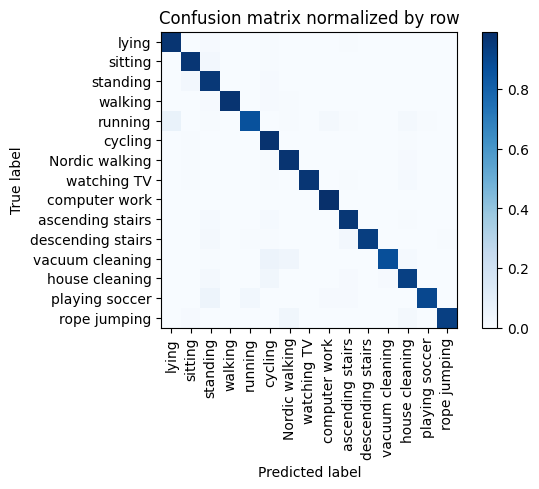

Training Epoch:  53%|█████▎    | 8/15 [06:29<06:01, 51.67s/it]

Overall accuracy: 0.956

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.986      0.993      0.990      0.131        588|	 house cleaning: 0.003,	playing soccer: 0.002,	
          walking       1.000      0.975      0.987      0.108        485|	 cycling: 0.008,	standing: 0.008,	
   Nordic walking       0.953      0.977      0.965      0.089        397|	 house cleaning: 0.010,	cycling: 0.008,	
            lying       0.969      0.972      0.970      0.087        389|	 standing: 0.010,	ascending stairs: 0.008,	
         standing       0.902      0.960      0.930      0.083        374|	 sitting: 0.024,	cycling: 0.008,	
          sitting       0.956      0.966      0.961      0.080        357|	 standing: 0.025,	cycling: 0.006,	
   house cleaning       0.941      0.927      0.934      0.077        344|	 cycling: 0.032,	standing: 0.020,	
  vacuum cleaning       0.989      0.873      0.927      0.070        315|	 cycling: 


train: 100%|██████████| 283/283 [00:44<00:00,  6.43batch/s, loss=6.86, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:06<00:00, 10.55batch/s, loss=6.27]


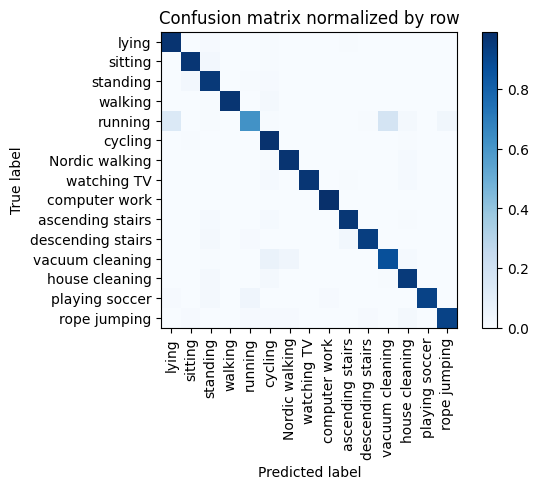

Training Epoch:  60%|██████    | 9/15 [07:20<05:09, 51.53s/it]

Overall accuracy: 0.948

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.993      0.995      0.131        588|	 cycling: 0.003,	house cleaning: 0.002,	
          walking       1.000      0.971      0.985      0.107        480|	 cycling: 0.021,	standing: 0.006,	
   Nordic walking       0.963      0.975      0.969      0.089        400|	 house cleaning: 0.013,	cycling: 0.007,	
            lying       0.939      0.974      0.956      0.087        392|	 standing: 0.010,	cycling: 0.008,	
         standing       0.909      0.957      0.933      0.084        376|	 sitting: 0.027,	cycling: 0.011,	
          sitting       0.958      0.966      0.962      0.080        358|	 standing: 0.025,	cycling: 0.006,	
   house cleaning       0.942      0.951      0.946      0.077        344|	 cycling: 0.020,	standing: 0.020,	
          cycling       0.842      0.984      0.907      0.070        314|	 house cleaning: 0.006,	si


train: 100%|██████████| 283/283 [00:45<00:00,  6.16batch/s, loss=6.57, accuracy=1]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:06<00:00, 10.71batch/s, loss=5.78]


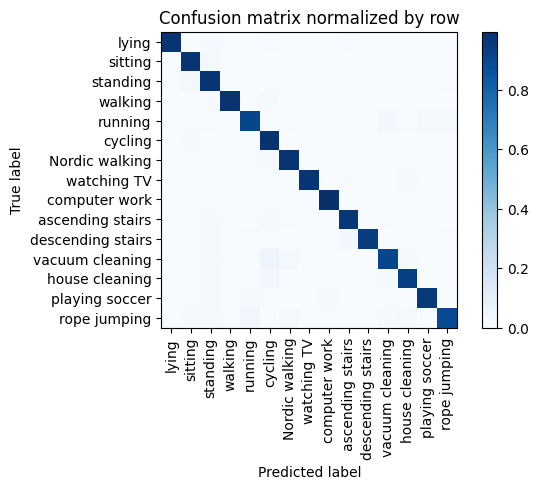

Training Epoch:  67%|██████▋   | 10/15 [08:14<04:20, 52.01s/it]

Overall accuracy: 0.963

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.997      0.995      0.996      0.130        583|	 house cleaning: 0.003,	playing soccer: 0.002,	
          walking       1.000      0.975      0.988      0.108        486|	 cycling: 0.012,	standing: 0.006,	
   Nordic walking       0.975      0.977      0.976      0.088        396|	 cycling: 0.010,	house cleaning: 0.008,	
            lying       1.000      0.975      0.987      0.088        393|	 standing: 0.010,	ascending stairs: 0.008,	
         standing       0.910      0.968      0.938      0.084        375|	 sitting: 0.019,	rope jumping: 0.005,	
          sitting       0.956      0.975      0.965      0.080        357|	 standing: 0.020,	rope jumping: 0.003,	
   house cleaning       0.955      0.936      0.945      0.076        342|	 cycling: 0.029,	standing: 0.020,	
          cycling       0.878      0.981      0.927      0.071        316|	


train: 100%|██████████| 283/283 [00:44<00:00,  6.39batch/s, loss=6.28, accuracy=0.922]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 15.93batch/s, loss=6.21]


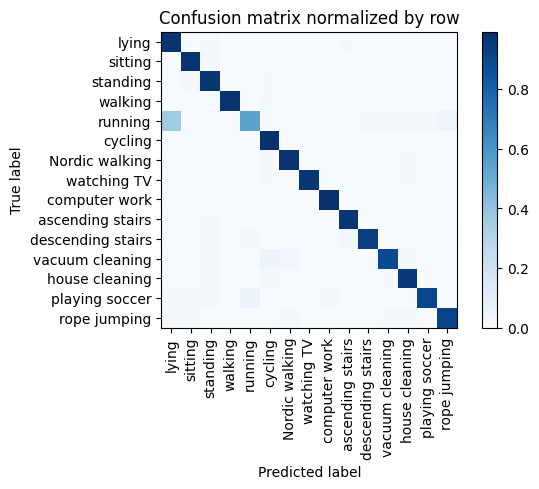

Training Epoch:  73%|███████▎  | 11/15 [09:03<03:24, 51.12s/it]

Overall accuracy: 0.949

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.993      0.996      0.131        589|	 house cleaning: 0.005,	playing soccer: 0.002,	
          walking       1.000      0.973      0.986      0.107        481|	 cycling: 0.015,	standing: 0.006,	
   Nordic walking       0.973      0.977      0.975      0.089        398|	 house cleaning: 0.010,	cycling: 0.010,	
            lying       0.853      0.972      0.909      0.087        389|	 ascending stairs: 0.013,	standing: 0.010,	
         standing       0.930      0.965      0.947      0.083        373|	 sitting: 0.019,	cycling: 0.011,	
          sitting       0.964      0.975      0.969      0.080        358|	 standing: 0.014,	cycling: 0.006,	
   house cleaning       0.935      0.957      0.946      0.077        346|	 cycling: 0.017,	standing: 0.012,	
  vacuum cleaning       0.979      0.893      0.934      0.071        317|	 cycling: 


train: 100%|██████████| 283/283 [00:47<00:00,  6.02batch/s, loss=6.73, accuracy=0.906]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:06<00:00, 11.03batch/s, loss=5.67]


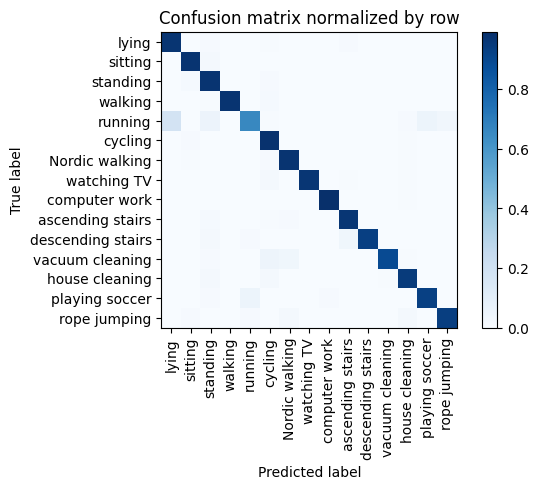

Training Epoch:  80%|████████  | 12/15 [09:57<02:35, 51.97s/it]

Overall accuracy: 0.954

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.993      0.996      0.131        586|	 house cleaning: 0.005,	playing soccer: 0.002,	
          walking       1.000      0.977      0.988      0.108        482|	 cycling: 0.012,	standing: 0.006,	
   Nordic walking       0.958      0.977      0.968      0.089        397|	 cycling: 0.010,	house cleaning: 0.008,	
            lying       0.925      0.972      0.948      0.087        391|	 ascending stairs: 0.010,	standing: 0.010,	
         standing       0.900      0.976      0.937      0.084        378|	 sitting: 0.013,	cycling: 0.008,	
          sitting       0.967      0.977      0.972      0.079        355|	 standing: 0.017,	rope jumping: 0.003,	
   house cleaning       0.953      0.948      0.950      0.077        344|	 cycling: 0.020,	standing: 0.020,	
  vacuum cleaning       0.993      0.891      0.939      0.070        313|	 cycl


train: 100%|██████████| 283/283 [00:49<00:00,  5.71batch/s, loss=6.5, accuracy=0.984]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:04<00:00, 14.80batch/s, loss=6.29]


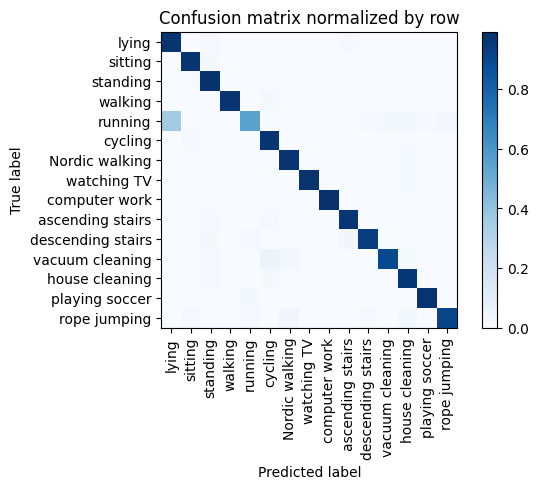

Training Epoch:  87%|████████▋ | 13/15 [10:51<01:45, 52.85s/it]

Overall accuracy: 0.953

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.993      0.996      0.131        588|	 house cleaning: 0.005,	sitting: 0.002,	
          walking       1.000      0.973      0.986      0.108        483|	 cycling: 0.017,	standing: 0.006,	
   Nordic walking       0.973      0.977      0.975      0.089        398|	 house cleaning: 0.013,	cycling: 0.005,	
            lying       0.860      0.974      0.913      0.087        390|	 ascending stairs: 0.010,	standing: 0.010,	
         standing       0.932      0.984      0.957      0.084        377|	 cycling: 0.005,	sitting: 0.005,	
          sitting       0.975      0.978      0.976      0.080        357|	 standing: 0.017,	rope jumping: 0.003,	
   house cleaning       0.933      0.962      0.947      0.077        346|	 cycling: 0.017,	standing: 0.012,	
  vacuum cleaning       0.979      0.897      0.936      0.070        312|	 cycling: 0.


train: 100%|██████████| 283/283 [00:41<00:00,  6.80batch/s, loss=6.73, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.52batch/s, loss=6.16]


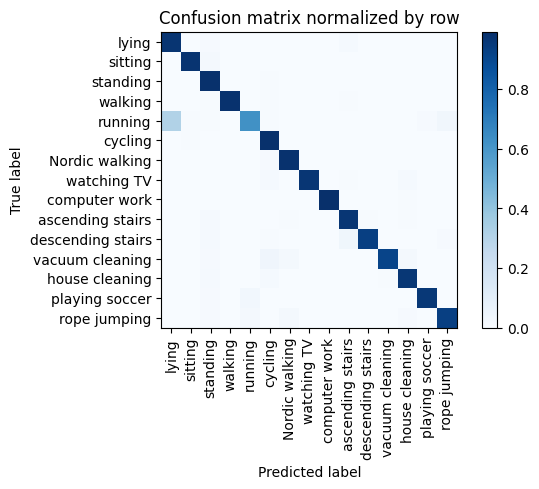

Training Epoch:  93%|█████████▎| 14/15 [11:39<00:51, 51.33s/it]

Overall accuracy: 0.959

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       0.998      0.993      0.996      0.133        594|	 house cleaning: 0.005,	playing soccer: 0.002,	
          walking       1.000      0.983      0.992      0.108        483|	 cycling: 0.006,	standing: 0.006,	
   Nordic walking       0.980      0.983      0.981      0.089        400|	 cycling: 0.010,	house cleaning: 0.003,	
            lying       0.874      0.972      0.920      0.086        386|	 ascending stairs: 0.013,	standing: 0.010,	
         standing       0.922      0.989      0.954      0.083        370|	 cycling: 0.005,	vacuum cleaning: 0.003,	
          sitting       0.989      0.978      0.983      0.080        358|	 standing: 0.017,	rope jumping: 0.003,	
   house cleaning       0.960      0.965      0.962      0.077        345|	 cycling: 0.014,	standing: 0.014,	
  vacuum cleaning       0.990      0.915      0.951      0.071        31


train: 100%|██████████| 283/283 [00:43<00:00,  6.45batch/s, loss=6.93, accuracy=0.953]


torch.Size([15, 400])



seen: 100%|██████████| 70/70 [00:05<00:00, 12.84batch/s, loss=6.31]


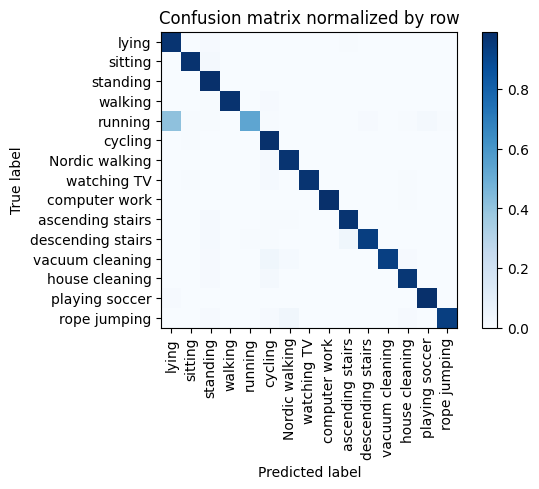

Overall accuracy: 0.958

                    precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

    computer work       1.000      0.993      0.997      0.130        583|	 house cleaning: 0.005,	playing soccer: 0.002,	
          walking       1.000      0.981      0.991      0.108        482|	 cycling: 0.008,	standing: 0.006,	
   Nordic walking       0.980      0.977      0.979      0.089        398|	 cycling: 0.015,	house cleaning: 0.003,	
            lying       0.841      0.977      0.904      0.087        391|	 standing: 0.010,	ascending stairs: 0.008,	
         standing       0.928      0.989      0.958      0.084        376|	 rope jumping: 0.003,	vacuum cleaning: 0.003,	
          sitting       0.980      0.980      0.980      0.080        357|	 standing: 0.017,	house cleaning: 0.003,	
   house cleaning       0.966      0.966      0.966      0.078        348|	 cycling: 0.017,	standing: 0.011,	
  vacuum cleaning       0.993      0.933      0.962      0.070   

unseen: 100%|██████████| 60/60 [00:03<00:00, 17.02batch/s, loss=16]  


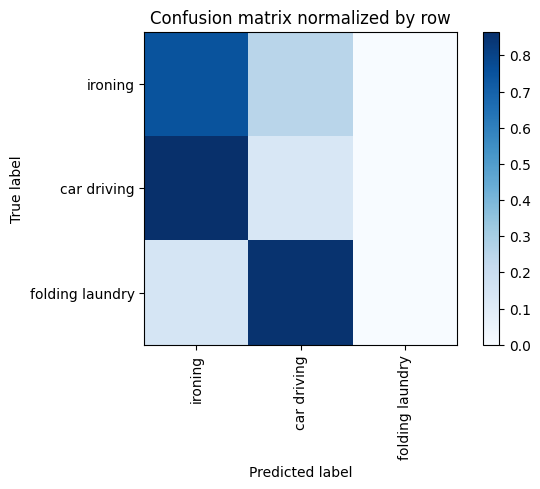

Overall accuracy: 0.473

                  precision     recall   f1-score rel. freq. abs. freq.|	 biggest thieves

        ironing       0.742      0.748      0.745      0.607       2330|	 car driving: 0.252,	folding laundry: 0.000,	
folding laundry       0.000      0.000      0.000      0.254        975|	 car driving: 0.852,	ironing: 0.148,	
    car driving       0.048      0.135      0.071      0.139        535|	 ironing: 0.865,	folding laundry: 0.000,	

----------------------------------------------------------------------------------------------------
    avg / total       0.457      0.473      0.462        1.0       3840|	      

{'accuracy': 0.47291666666666665, 'precision': 0.2633888650995813, 'recall': 0.29435909777652985, 'f1': 0.272095390808412}
============== Overall Unseen Classes Performance ==============


accuracy     0.297400
precision    0.205638
recall       0.255531
f1           0.197817
dtype: float64

In [74]:
fold_metric_scores = []
for i, cs in enumerate(fold_cls_ids):
    print("="*16, f'Fold-{i}', "="*16)
    print(f'Unseen Classes : {fold_classes[i]}')

    data_dict = dataReader.generate(unseen_classes=cs, seen_ratio=config['seen_split'], unseen_ratio=config['unseen_split'], window_size=5.21, window_overlap=4.21, resample_freq=20)
    all_classes = dataReader.idToLabel
    seen_classes = data_dict['seen_classes']
    unseen_classes = data_dict['unseen_classes']
    print("seen classes > ", seen_classes)
    print("unseen classes > ", unseen_classes)
    train_n, in_ft = data_dict['train']['X'].shape

    print("Initiate IMU datasets ...")
    # build IMU datasets
    train_dt = PAMAP2Dataset(data=data_dict['train']['X'], actions=data_dict['train']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    train_dl = DataLoader(train_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build seen eval_dt
    eval_dt = PAMAP2Dataset(data=data_dict['eval-seen']['X'], actions=data_dict['eval-seen']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=seen_classes, seq_len=100)
    eval_dl = DataLoader(eval_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    # build unseen test_dt
    test_dt = PAMAP2Dataset(data=data_dict['test']['X'], actions=data_dict['test']['y'], attributes=video_feat, attribute_dict=action_dict, action_classes=unseen_classes, seq_len=100)
    test_dl = DataLoader(test_dt, batch_size=config['batch_size'], shuffle=True, pin_memory=True, drop_last=True)
    
    # build model
    model = SOTAEmbedding(
        linear_filters=config["model_params"]["linear_filters"],
        input_feat=config["model_params"]["input_feat"],
        dropout=config["model_params"]["dropout"]
    )
    # model = Model1(feat_dim=in_ft, max_len=seq_len, d_model=config['d_model'], n_heads=config['num_heads'], num_layers=2, dim_feedforward=128, ft_size=feat_size)
    model.to(device)
    # define run parameters 
    optimizer = Adam(model.parameters(), lr=config['lr'],weight_decay=1e-5)
    loss_module = {'class': nn.CrossEntropyLoss(reduction="sum"), 'feature': nn.L1Loss(reduction="sum")}
    best_acc = 0.0
    # train the model 
    for epoch in tqdm(range(config['n_epochs']), desc='Training Epoch', leave=False):
        train_metrics = train_step(model, train_dl, train_dt,optimizer, loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='train', loss_alpha=0.0001)
        eval_metrics = eval_step(model, eval_dl, eval_dt,loss_module, device, class_names=[all_classes[i] for i in seen_classes], phase='seen', print_report=True, loss_alpha=0.0001)
        # print(f"EPOCH [{epoch}] TRAINING : {train_metrics}")
        # print(f"EPOCH [{epoch}] EVAL : {eval_metrics}")
        if eval_metrics['accuracy'] > best_acc:
            best_model = deepcopy(model.state_dict())
    
    # replace by best model 
    model.load_state_dict(best_model)
    save_model(model,notebook_iden,model_iden,i)

    # run evaluation on unseen classes
    test_metrics = eval_step(model, test_dl,test_dt, loss_module, device, class_names=[all_classes[i] for i in unseen_classes],   phase='unseen', loss_alpha=0.0001)
    fold_metric_scores.append(test_metrics)
    print(test_metrics)
    print("="*40)

print("="*14, "Overall Unseen Classes Performance", "="*14)
seen_score_df = pd.DataFrame.from_records(fold_metric_scores)
seen_score_df.mean()
